# Automatyczna klasyfikacja stanu opon samochodowych przy użyciu technik głębokiego uczenia

## Poczatkowe ustawienia

### Google Drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Definicja styli


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the style directly using seaborn
sns.set_theme(style='darkgrid')  # Base style

# Define custom modifications
plt.rcParams['axes.titlesize'] = 14  # Title size
plt.rcParams['axes.labelsize'] = 12  # Axis label size
plt.rcParams['xtick.labelsize'] = 10  # X tick label size
plt.rcParams['ytick.labelsize'] = 10  # Y tick label size
plt.rcParams['axes.edgecolor'] = 'gray'  # Axis edge color
plt.rcParams['axes.facecolor'] = 'white'  # Background color

### Dane

 W ramach projektu skorzystano z dwóch ogólnodostępnych zbiorów danych, które są jedynymi, do których udało się uzyskać dostęp w kontekście tego badania.

1. **Kaggle Tyre Quality Classification** - https://www.kaggle.com/datasets/warcoder/tyre-quality-classification/code
2. **Mendeley Data Tyre Dataset** - https://data.mendeley.com/datasets/32b5vfj6tc/


In [ ]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

path_to_kaggle_data = '/content/drive/My Drive/Magisterka/Data/Kaggle Dataset/'
path_to_mendeley_data = '/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/'
output_folder = '/content/drive/My Drive/Magisterka/ResearchData/'

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

## Analiza zbioru danych

### Podstawowe informacje o zbiorach danych

In [ ]:
import os
import hashlib
from PIL import Image
from pathlib import Path
import random
import matplotlib.pyplot as plt

In [ ]:
import os
from PIL import Image

def analyze_dataset(path, categories=['good', 'defective']):
    """Analyzes dataset for given categories to gather various image properties."""
    data_info = {
        'total_images': 0,
        'square_images': 0,
        'grayscale_images': 0,
        'unique_sizes': set(),
        'non_square_sizes': set(),  # Set to hold non-square image sizes
        'category_counts': {category: 0 for category in categories},
        'defective_count': 0,
        'total_width': 0,
        'total_height': 0,
        'file_sizes': [],
    }

    for category in categories:
        category_path = os.path.join(path, category)
        images = os.listdir(category_path)
        data_info['category_counts'][category] = len(images)
        data_info['total_images'] += len(images)

        if category == 'defective':
            data_info['defective_count'] += len(images)

        for image_name in images:
            image_path = os.path.join(category_path, image_name)
            try:
                with Image.open(image_path) as img:
                    size = img.size
                    data_info['unique_sizes'].add(size)
                    if size[0] == size[1]:
                        data_info['square_images'] += 1
                    else:
                        data_info['non_square_sizes'].add(size)

                    if img.mode == 'L':
                        data_info['grayscale_images'] += 1

                    data_info['total_width'] += size[0]
                    data_info['total_height'] += size[1]

                    aspect_ratio = round(size[0] / size[1], 2)
                    if 'aspect_ratios' not in data_info:
                        data_info['aspect_ratios'] = {}
                    if aspect_ratio in data_info['aspect_ratios']:
                        data_info['aspect_ratios'][aspect_ratio] += 1
                    else:
                        data_info['aspect_ratios'][aspect_ratio] = 1

                    file_size_kb = os.path.getsize(image_path) / 1024  # KB
                    data_info['file_sizes'].append(file_size_kb)
            except Exception as e:
                print(f"Error processing image {image_path}: {e}")

    if data_info['total_images'] > 0:
        data_info['defective_percentage'] = (data_info['defective_count'] / data_info['total_images']) * 100
    else:
        data_info['defective_percentage'] = 0

    if data_info['total_images'] > 0:
        data_info['average_width'] = data_info['total_width'] / data_info['total_images']
        data_info['average_height'] = data_info['total_height'] / data_info['total_images']
    else:
        data_info['average_width'] = 0
        data_info['average_height'] = 0

    if data_info['file_sizes']:
        data_info['average_file_size'] = sum(data_info['file_sizes']) / len(data_info['file_sizes'])
    else:
        data_info['average_file_size'] = 0

    return data_info

def display_dataset_info(data_info, dataset_name):
    """Displays collected dataset information."""
    print(f"Informacje o zbiorze danych {dataset_name}:")
    print(f"  Łączna liczba obrazów: {data_info['total_images']}")
    for category, count in data_info['category_counts'].items():
        print(f"  Liczba obrazów w kategorii '{category}': {count}")
    print(f"  Liczba obrazów kwadratowych: {data_info['square_images']}")
    print(f"  Liczba obrazów w skali szarości: {data_info['grayscale_images']}")
    print(f"  Unikalne rozmiary obrazów: {data_info['unique_sizes']}")
    print(f"  Rozmiary obrazów niekwadratowych: {data_info['non_square_sizes']}")
    print(f"  Procent uszkodzonych obrazów: {data_info.get('defective_percentage', 0):.2f}%")
    print(f"  Średnia szerokość obrazów: {data_info.get('average_width', 0):.2f} pikseli")
    print(f"  Średnia wysokość obrazów: {data_info.get('average_height', 0):.2f} pikseli")
    print(f"  Rozkład proporcji (Aspect Ratios): {data_info.get('aspect_ratios', {})}")
    print(f"  Średni rozmiar pliku: {data_info.get('average_file_size', 0):.2f} KB")


In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
import matplotlib.patches as patches

def display_random_images(
    dataset_path,
    num_images=12,
    nrows=3,
    ncols=4,
    target_size=(300, 300),
    padding_color=(255, 255, 255),
    border_color='black',
    border_width=2,
    label_bg_color=(0, 0, 0, 0.6),
    label_text_color='white',
    label_fontsize=16
):
    """
    Displays random images with labels overlaid on them with a full-width semi-transparent background
    at the bottom of each image. All images are scaled to a uniform size while maintaining aspect ratios
    without cropping. Additionally, a border is added around each image, and padding fills any remaining
    space.

    :param dataset_path: Path to the dataset folder containing 'good' and 'defective' subdirectories.
    :param num_images: Number of images to display. Default is 12.
    :param nrows: Number of rows in the subplot grid. Default is 3.
    :param ncols: Number of columns in the subplot grid. Default is 4.
    :param target_size: Tuple (width, height) in pixels to scale images. Default is (300, 300).
    :param padding_color: Background color for padding as a tuple (R, G, B). Default is white (255, 255, 255).
    :param border_color: Color of the border around each image. Default is 'black'.
    :param border_width: Width of the border in pixels. Default is 2.
    :param label_bg_color: Background color for the label in RGBA format. Default is semi-transparent black (0, 0, 0, 0.6).
    :param label_text_color: Color of the label text. Default is 'white'.
    :param label_fontsize: Font size of the label text. Default is 16.
    """
    # Define the categories and their corresponding labels
    categories = {
        'good': 'Sprawna',
        'defective': 'Wadliwa'
    }

    # Prepare paths for each category
    category_paths = {category: os.path.join(dataset_path, category) for category in categories}

    # Collect all image file paths from each category
    all_images = []
    for category, path in category_paths.items():
        if not os.path.isdir(path):
            print(f"Warning: Directory '{path}' does not exist. Skipping this category.")
            continue
        # List all files in the category directory
        category_images = [
            os.path.join(path, f) for f in os.listdir(path)
            if os.path.isfile(os.path.join(path, f))
        ]
        all_images.extend(category_images)

    if not all_images:
        print("Error: No images found in the specified dataset path.")
        return

    # Shuffle the combined list of images
    random.shuffle(all_images)

    # Select a random sample of images
    selected_images = random.sample(all_images, min(num_images, len(all_images)))

    # Set up the plot with specified number of rows and columns
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 3, nrows * 3))
    axes = axes.ravel()  # Flatten the axes array for easy iteration

    for i, image_path in enumerate(selected_images):
        try:
            # Open and convert the image to RGB
            img = Image.open(image_path).convert("RGB")

            # Scale the image while maintaining aspect ratio
            if hasattr(Image, 'Resampling'):
                resample_method = Image.Resampling.LANCZOS
            else:
                resample_method = Image.LANCZOS  # For older Pillow versions
            img.thumbnail(target_size, resample_method)

            # Create a new image with padding
            new_img = Image.new("RGB", target_size, padding_color)
            # Calculate position to paste the scaled image to center it
            paste_position = (
                (target_size[0] - img.width) // 2,
                (target_size[1] - img.height) // 2
            )
            new_img.paste(img, paste_position)

            # Determine the label based on the category
            label = "Sprawna" if 'good' in image_path.lower() else "Wadliwa"

            # Display the image
            axes[i].imshow(new_img)
            axes[i].axis('off')  # Hide axis ticks and labels

            # Add a semi-transparent rectangle as background for the label
            axes[i].add_patch(
                patches.Rectangle(
                    (0, 0), 1, 0.12,  # Position and size in axis coordinates
                    color=label_bg_color,  # Background color with transparency
                    transform=axes[i].transAxes,  # Use axis coordinates
                    zorder=1000  # Draw below the text
                )
            )

            # Add the label text on top of the semi-transparent background
            axes[i].text(
                0.5, 0.06, label,  # Position in axis coordinates
                fontsize=label_fontsize,
                color=label_text_color,
                weight='bold',
                ha='center',
                va='center',
                transform=axes[i].transAxes,  # Use axis coordinates
                zorder=1001  # Draw above the rectangle
            )

            # Add a border around the image
            axes[i].add_patch(
                patches.Rectangle(
                    (0, 0), 1, 1,  # Position and size in axis coordinates
                    linewidth=border_width,
                    edgecolor=border_color,
                    facecolor='none',  # No fill color
                    transform=axes[i].transAxes,  # Use axis coordinates
                    zorder=1002  # Draw above everything else
                )
            )

        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            axes[i].axis('off')  # Hide the subplot if image loading fails
            continue

    # Hide any unused subplots
    for j in range(len(selected_images), nrows * ncols):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
# Analyze datasets
kaggle_data_info = analyze_dataset(path_to_kaggle_data)
mendeley_data_info = analyze_dataset(path_to_mendeley_data)

# Display dataset information
display_dataset_info(kaggle_data_info, "Kaggle")
print("\n")
display_dataset_info(mendeley_data_info, "Mendeley")

Informacje o zbiorze danych Kaggle:
  Łączna liczba obrazów: 1856
  Liczba obrazów w kategorii 'good': 828
  Liczba obrazów w kategorii 'defective': 1028
  Liczba obrazów kwadratowych: 878
  Liczba obrazów w skali szarości: 1
  Unikalne rozmiary obrazów: {(2259, 2259), (428, 428), (488, 488), (2728, 2728), (520, 520), (1218, 1218), (2168, 2168), (369, 369), (580, 580), (2049, 2049), (1200, 1200), (2292, 2292), (2109, 2109), (672, 672), (1503, 1503), (1839, 1839), (1233, 1233), (494, 494), (1041, 1041), (435, 435), (646, 646), (1344, 1344), (2703, 2703), (495, 495), (1587, 1587), (2116, 2116), (2510, 2510), (528, 528), (2602, 2602), (2240, 2240), (620, 620), (831, 831), (579, 579), (469, 469), (561, 561), (4000, 3000), (1443, 1443), (2214, 2214), (915, 915), (2274, 2274), (354, 353), (1425, 1425), (686, 686), (2517, 2517), (1476, 1476), (250, 250), (838, 838), (1536, 1536), (1568, 1568), (2156, 2156), (2550, 2550), (1628, 1628), (1266, 1266), (2248, 2248), (1509, 1509), (1812, 1812), (1

#### Przykładowe zdjęcia opon w poszczególnych zbiorach

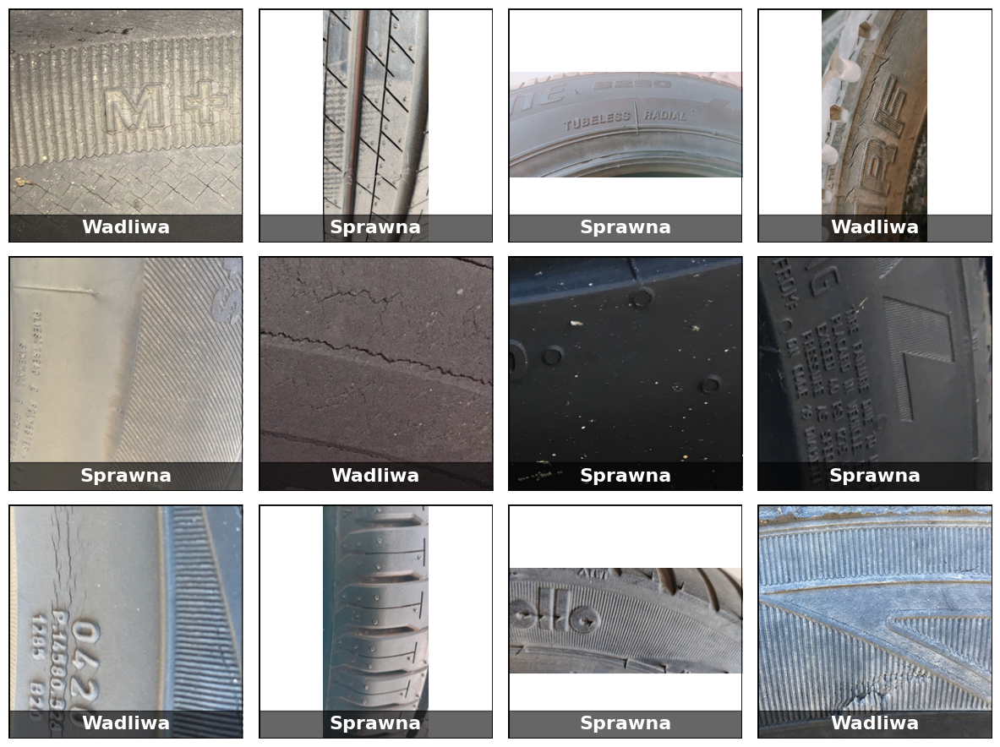

In [ ]:
display_random_images(dataset_path=path_to_kaggle_data)

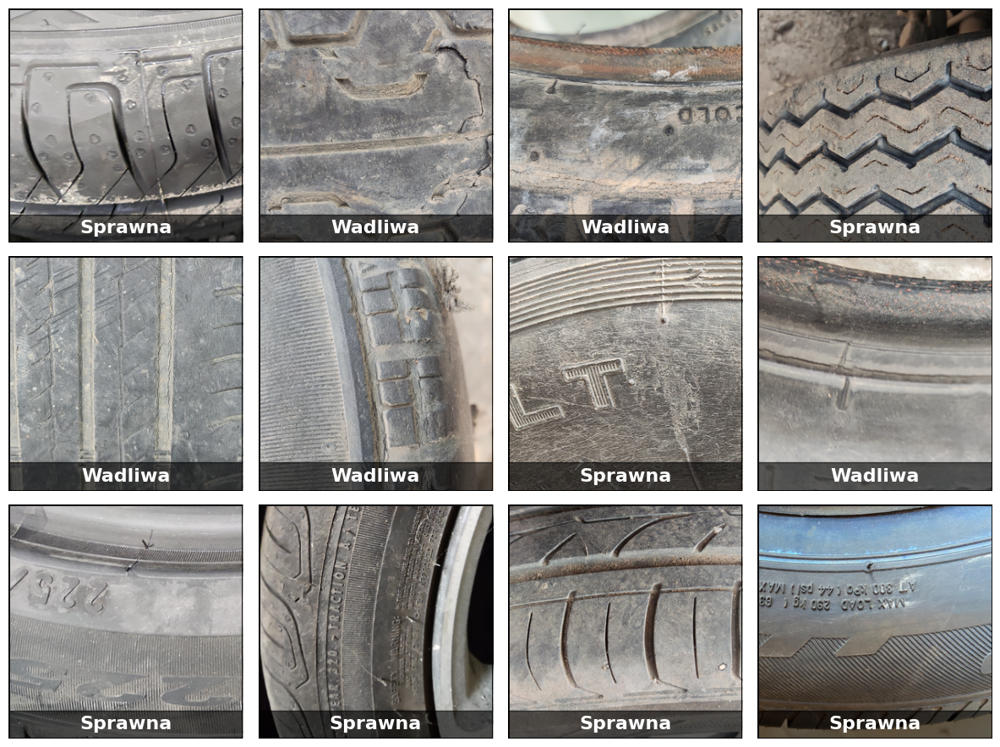

In [ ]:
display_random_images(path_to_mendeley_data)

#### Sprawdzenie czy istnieją duplikaty

In [ ]:
# Function to compute the hash of an image file
def get_image_hash(image):
    """Compute the MD5 hash for an image."""
    md5 = hashlib.md5()
    md5.update(image.tobytes())
    return md5.hexdigest()

# Function to find duplicates in directories
def find_duplicates(base_path):
    """Walk through directories to find duplicate images."""
    hashes = {}  # Dictionary to hold the hashes of the images
    file_counter = 0  # Counter to track number of files processed
    duplicate_pairs = []  # List to store pairs of duplicate images

    for dirpath, dirnames, filenames in os.walk(base_path):
        for filename in filenames:
            # Process only JPEG and PNG images
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_path = os.path.join(dirpath, filename)
                with Image.open(image_path) as image:
                    image_hash = get_image_hash(image)

                    # Add the image path to the corresponding hash entry in the dictionary
                    if image_hash in hashes:
                        hashes[image_hash].append(image_path)
                    else:
                        hashes[image_hash] = [image_path]
                file_counter += 1

    # Check for duplicates
    for image_list in hashes.values():
        if len(image_list) > 1:
            for i in range(len(image_list)):
                for j in range(i + 1, len(image_list)):
                    duplicate_pairs.append((image_list[i], image_list[j]))

    return file_counter, duplicate_pairs

In [ ]:
base_path = Path("/content/drive/My Drive/Magisterka/Data")
total_images, duplicates = find_duplicates(base_path)

print(f"Przetworzono łącznie {total_images} obrazów.")
if duplicates:
    print(f"Znaleziono {len(duplicates)} par duplikatów obrazów.")
    print("Znalezione pary duplikatów:")
    for pair in duplicates:
        print(pair)

Przetworzono łącznie 3554 obrazów.
Znaleziono 36 par duplikatów obrazów.
Znalezione pary duplikatów:
('/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/good/good (377).jpg', '/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/good/good (619).jpg')
('/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/good/good (108).jpg', '/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/good/good (467).jpg')
('/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/defective/Defective (618).jpg', '/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/defective/Defective (611).jpg')
('/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/defective/Defective (91).jpg', '/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/defective/Defective (48).jpg')
('/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/defective/Defective (28).jpg', '/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/defective/Defective (27).jpg'

### Konsolidacja Danych i Usuwanie Duplikatów

In [ ]:
import os
import shutil
from PIL import Image
from pathlib import Path

def merge_datasets(source_paths, output_folder, categories=['good', 'defective']):
    """
    Merges datasets from different sources, removes duplicates, and saves the results with source labels.

    Parameters:
    - source_paths: List of tuples [(path1, label1), (path2, label2), ...]
    - output_folder: Path to the output directory
    - categories: List of category names
    """
    # Ensure the output directory exists
    output_folder = Path(output_folder)
    output_folder.mkdir(parents=True, exist_ok=True)

    seen_images = set()  # Set to track seen (non-duplicate) images
    image_count = 0  # Counter for total images processed

    # Process each category
    for category in categories:
        category_folder = output_folder / category
        category_folder.mkdir(exist_ok=True)

        for source_path, label in source_paths:
            category_path = Path(source_path) / category
            if not category_path.exists():
                print(f"Ścieżka {category_path} nie istnieje. Pomijam.")
                continue

            for image_name in os.listdir(category_path):
                image_path = category_path / image_name
                if not image_path.is_file():
                    continue

                try:
                    with Image.open(image_path) as img:
                        img_hash = get_image_hash(img)
                except Exception as e:
                    print(f"Nie można otworzyć obrazu {image_path}: {e}")
                    continue

                if img_hash not in seen_images:
                    seen_images.add(img_hash)
                    name, ext = os.path.splitext(image_name)
                    new_image_name = f"{name}_{label}{ext}"
                    target_path = category_folder / new_image_name

                    if target_path.exists():
                        unique_id = hashlib.md5(os.urandom(16)).hexdigest()[:8]
                        new_image_name = f"{name}_{label}_{unique_id}{ext}"
                        target_path = category_folder / new_image_name

                    shutil.copy2(image_path, target_path)
                    image_count += 1

    print(f"Łączna liczba zapisanych unikalnych obrazów: {image_count}")

In [ ]:
merge_datasets(
    source_paths=[
        (path_to_kaggle_data, 'kaggle'),
        (path_to_mendeley_data, 'mendeley')
    ],
    output_folder=output_folder
)

Łączna liczba zapisanych unikalnych obrazów: 3518


### Postawowe informacje o docelowym zbiorze badawczym

In [ ]:
# Path to the research dataset folder
research_dataset_path = '/content/drive/My Drive/Magisterka/ResearchData'

In [ ]:
research_data_info = analyze_dataset(research_dataset_path)

# Display dataset information
display_dataset_info(research_data_info, "Research Dataset")

Informacje o zbiorze danych Research Dataset:
  Łączna liczba obrazów: 3518
  Liczba obrazów w kategorii 'good': 1655
  Liczba obrazów w kategorii 'defective': 1863
  Liczba obrazów kwadratowych: 2567
  Liczba obrazów w skali szarości: 1
  Unikalne rozmiary obrazów: {(2259, 2259), (428, 428), (488, 488), (2728, 2728), (520, 520), (1218, 1218), (2168, 2168), (369, 369), (580, 580), (2049, 2049), (1200, 1200), (2292, 2292), (2109, 2109), (672, 672), (1990, 1990), (1503, 1503), (1839, 1839), (2050, 2050), (1100, 1100), (1233, 1233), (494, 494), (1780, 1780), (1041, 1041), (435, 435), (646, 646), (1344, 1344), (2703, 2703), (495, 495), (1587, 1587), (2116, 2116), (2510, 2510), (2148, 2148), (528, 528), (1620, 1620), (2602, 2602), (2240, 2240), (620, 620), (831, 831), (579, 579), (469, 469), (561, 561), (2090, 2090), (4000, 3000), (1443, 1443), (2214, 2214), (915, 915), (2274, 2274), (354, 353), (1425, 1425), (686, 686), (2517, 2517), (1476, 1476), (250, 250), (838, 838), (1536, 1536), (156

W badanym zbiorze danych znajduje się 226 różnych wymiarów zdjęć, z których najczęstszym jest 2250x2250. Wśród obrazów występują zarówno formaty kwadratowe jak i prostokątne

#### Rozkład klas

In [ ]:
import plotly.express as px

def display_category_proportions(data_info):
    categories = ['Poprawne', 'Wadliwe']
    counts = [data_info['category_counts'][category] for category in ['good', 'defective']]
    total = sum(counts)
    percentages = [(count / total * 100) for count in counts]

    # Using Plotly Express to create a horizontal bar chart
    fig = px.bar(
        x=percentages,
        y=categories,
        text_auto=".1f",  # Display one decimal place
        orientation='h',  # Horizontal bar chart
        title="Rozkład jakości opon w zbiorze badawczym",
        color_discrete_sequence=["#3B3B6D"],  # Matching the dark blue color used earlier
        height=280,
        width=840
    )
    # Updating the chart layout and styles
    fig.update_xaxes(title="Procentowy udział", range=[-1, 65])
    fig.update_yaxes(title="")
    fig.update_traces(textposition='outside')
    fig.update_layout(
        font=dict(
            family="Arial",  # Consistent font family
            size=12,  # Adjust font size for readability
            color="black"  # Ensuring text is easy to read
        ),
        title_font=dict(
            family="Arial",
            size=18,
            color="black"
        ),
        plot_bgcolor="white",  # Background color for the plot area
        paper_bgcolor="white",  # Background color outside the plot area
        xaxis_showgrid=False,  # Removing grid lines for a clean look
        yaxis_showgrid=False,
        bargap=0.4,  # Adjusting the gap between bars
        title_x=0.5  # Centering the title
    )
    fig.show()

# Display the category proportions
display_category_proportions(research_data_info)

Rozkład klas w zbiorze danych to 47% dla klasy 'Dobre' i 53% dla klasy 'Wadliwe', co jest stosunkowo zrównoważone dla potrzeb klasyfikacji binarnej. Taka dystrybucja nie wymaga specjalnych technik przetwarzania wstępnego, które są potrzebne w przypadkach bardziej ekstremalnego niezrównoważenia klas. Standardowe algorytmy uczenia maszynowego powinny efektywnie radzić sobie z takim rozkładem.

#### Przykładowe zdjęcia

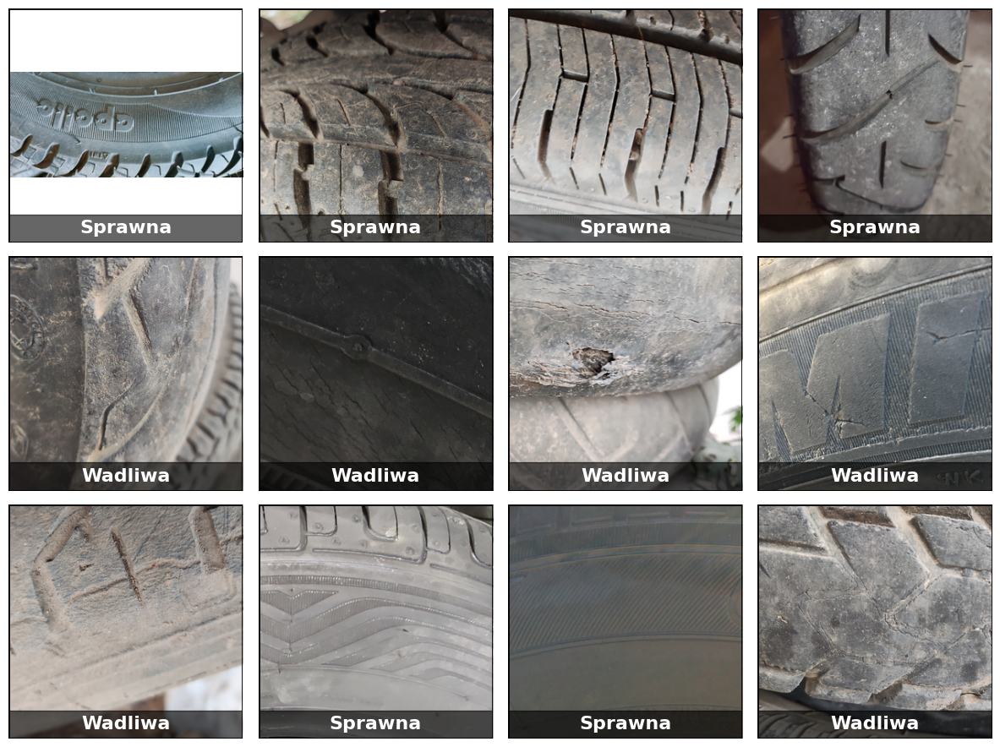

In [ ]:
display_random_images(research_dataset_path)

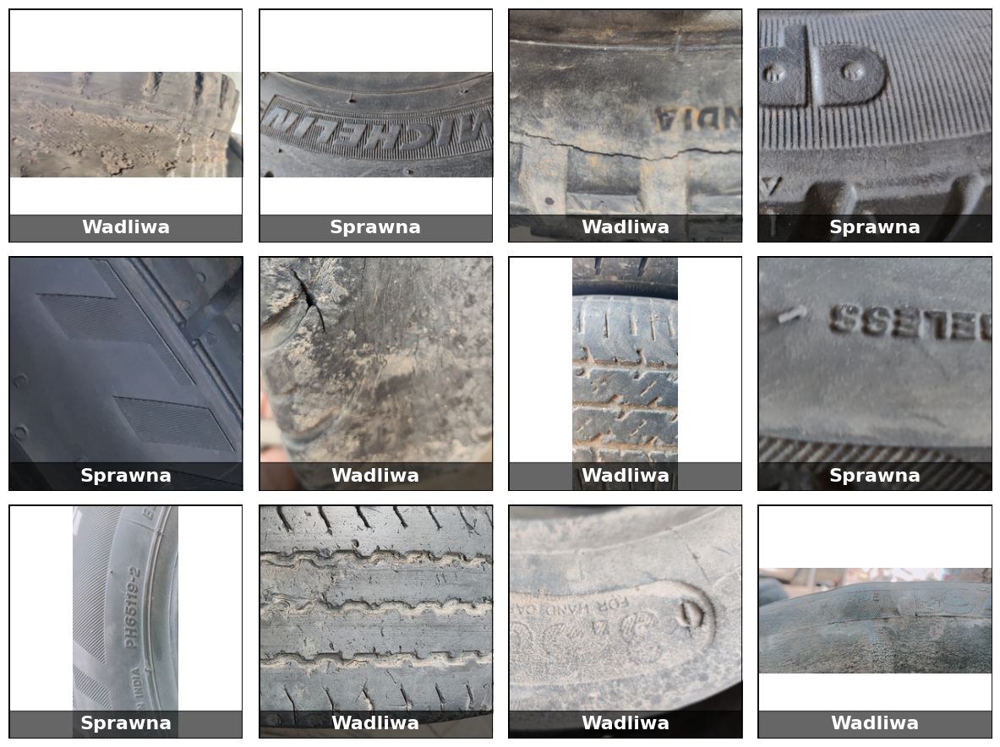

In [ ]:
display_random_images(research_dataset_path)

#### Wymiary zdjęć


In [ ]:
def get_image_dimensions(path, categories=['good', 'defective']):
    dimensions = {'good': [], 'defective': []}

    for category in categories:
        category_path = os.path.join(path, category)
        images = os.listdir(category_path)

        for image_name in images:
            image_path = os.path.join(category_path, image_name)
            try:
                with Image.open(image_path) as img:
                    width, height = img.size
                    dimensions[category].append((width, height))
            except Exception as e:
                print(f"Error processing image {image_path}: {e}")

    return dimensions


In [ ]:
def plot_tire_image_dimensions(dimensions):
    """Plots the width and height of tire images (good as 'Sprawnych', defective as 'Wadliwych')."""

    for category, dims in dimensions.items():
        if dims:
            # Separate widths and heights from dimensions
            widths, heights = zip(*dims)
            plt.figure(figsize=(10, 6))

            # Use 'x' as the marker and increase transparency
            plt.scatter(widths, heights, label=f'{category.capitalize()}', alpha=0.8, marker='x', s=50, color='blue')

            # Title with Polish names for categories and pixel unit
            if category == 'good':
                plt.title('Wymiary zdjęć opon sprawnych w pikselach')
            else:
                plt.title('Wymiary zdjęć opon wadliwych w pikselach')

            # Label axes
            plt.xlabel('Szerokość (Width)')
            plt.ylabel('Wysokość (Height)')

            # More visible grid with dashed lines
            plt.grid(True, linestyle='--', alpha=0.6)

            # Show legend and plot
            plt.legend()
            plt.show()
        else:
            print(f"No data available for category: {category}")


In [ ]:
dimensions = get_image_dimensions(research_dataset_path)

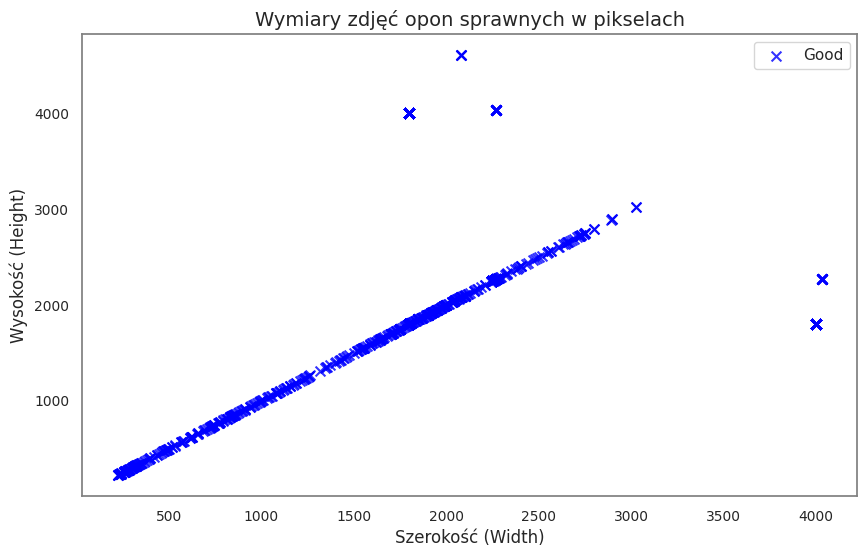

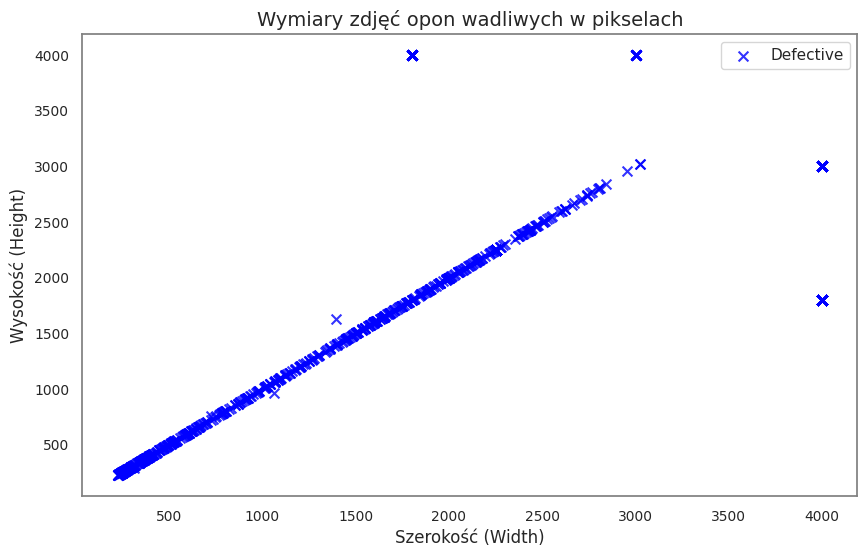

In [ ]:
plot_tire_image_dimensions(dimensions)

In [ ]:
def plot_boxplot_image_dimensions(dimensions):
    """Plots box plots for width and height of tire images for good and defective categories with custom styling."""

    for category, dims in dimensions.items():
        if dims:
            # Separate widths and heights
            widths, heights = zip(*dims)
            plt.figure(figsize=(10, 6))

            # Create box plot for width and height
            plt.boxplot([widths, heights], labels=['Szerokość (Width)', 'Wysokość (Height)'], patch_artist=True,
                        boxprops=dict(facecolor='lightblue', color='blue'),  # Color styling for the box
                        medianprops=dict(color='red'),  # Color for the median line
                        whiskerprops=dict(color='blue'),  # Color for whiskers
                        capprops=dict(color='blue'),  # Color for caps
                        flierprops=dict(marker='o', color='red', markersize=8, alpha=0.5))  # Outliers styling

            # Title with Polish names for categories
            if category == 'good':
                plt.title('Rozkład szerokości i wysokości zdjęć opon sprawnych w pikselach')
            else:
                plt.title('Rozkład szerokości i wysokości zdjęć opon wadliwych w pikselach')

            # Labels for the axes
            plt.xlabel('Rodzaj wymiaru')
            plt.ylabel('Wymiary w pikselach')

            # Add a more visible grid
            plt.grid(True, linestyle='--', alpha=0.6)

            # Show plot
            plt.show()
        else:
            print(f"No data available for category: {category}")


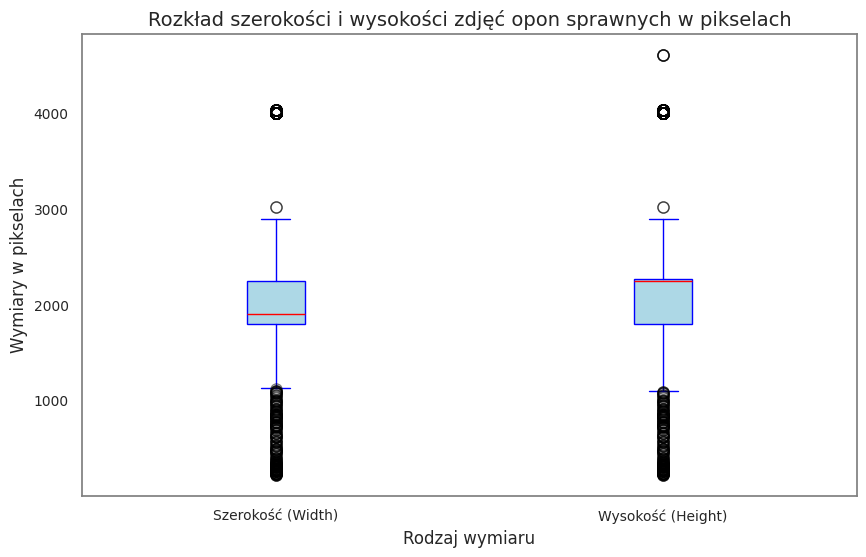

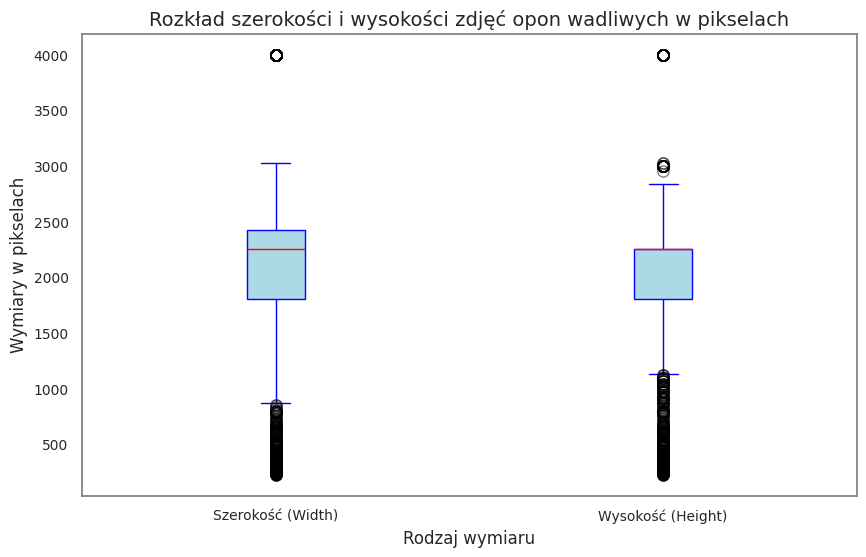

In [ ]:
plot_boxplot_image_dimensions(dimensions)

Wnioski:
* Podobieństwa w rozkładach: Mediany oraz zakresy dla szerokości i wysokości obrazów opon sprawnych i wadliwych są zbliżone
* Brak istotnych różnic w wymiarach obrazów między klasami

#### Rozkład kolorów w obrazach

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_color_distribution_by_category(dataset_path, categories=['good', 'defective']):
    """Plots the average color distribution for 'good' and 'defective' images in separate plots."""

    for category in categories:
        hist_r = np.zeros((256,))
        hist_g = np.zeros((256,))
        hist_b = np.zeros((256,))
        total_images = 0

        category_path = os.path.join(dataset_path, category)
        if not os.path.exists(category_path):
            print(f"Directory not found: {category_path}")
            continue

        # List all image files in the category folder
        image_files = [f for f in os.listdir(category_path) if f.endswith(('.jpg', '.png'))]

        # Process each image
        for image_file in image_files:
            image_path = os.path.join(category_path, image_file)
            image = cv2.imread(image_path)

            if image is None:
                print(f"Error loading image: {image_file}")
                continue

            channels = cv2.split(image)  # Split into R, G, B channels

            # Accumulate the histograms for each channel
            hist_b += cv2.calcHist([channels[0]], [0], None, [256], [0, 256]).flatten()
            hist_g += cv2.calcHist([channels[1]], [0], None, [256], [0, 256]).flatten()
            hist_r += cv2.calcHist([channels[2]], [0], None, [256], [0, 256]).flatten()

            total_images += 1

        # Check if any images were processed
        if total_images == 0:
            print(f"No images found in {category_path}")
            continue

        # Normalize the histograms by the number of images
        hist_r /= total_images
        hist_g /= total_images
        hist_b /= total_images

        # Plot the histograms for R, G, B channels for the current category
        plt.figure(figsize=(12, 6))
        plt.plot(hist_b, color='blue', label='Blue')
        plt.plot(hist_g, color='green', label='Green')
        plt.plot(hist_r, color='red', label='Red')

        # Add title based on the category
        if category == 'good':
            plt.title('Średni rozkład kolorów w obrazach opon sprawnych (RGB)')
        else:
            plt.title('Średni rozkład kolorów w obrazach opon wadliwych (RGB)')

        # Labels and legend
        plt.xlabel('Wartość koloru (Color Value)')
        plt.ylabel('Średnia liczba pikseli (Average Pixel Count)')
        plt.legend(loc='upper right')
        plt.grid(True, linestyle='--', alpha=0.6)

        # Show the plot for the current category
        plt.show()


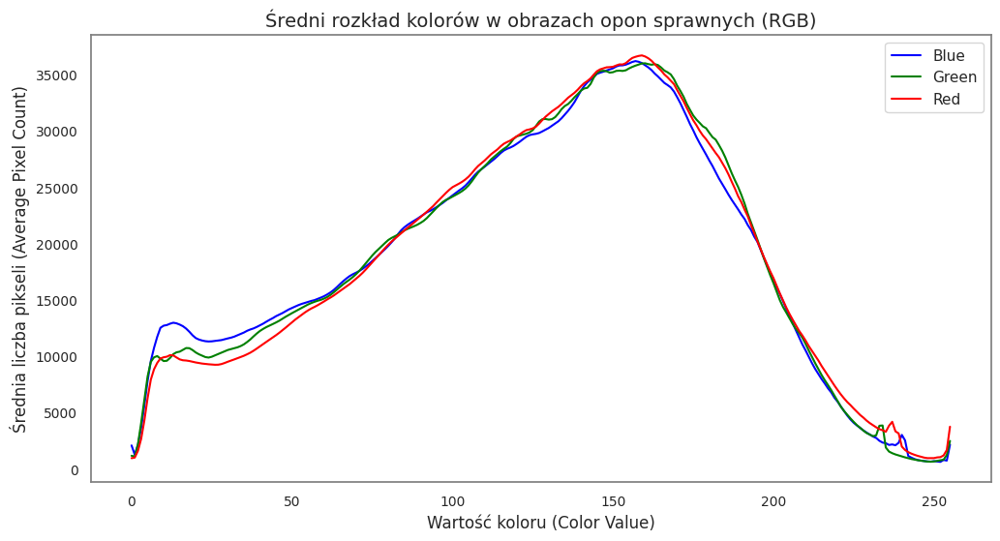

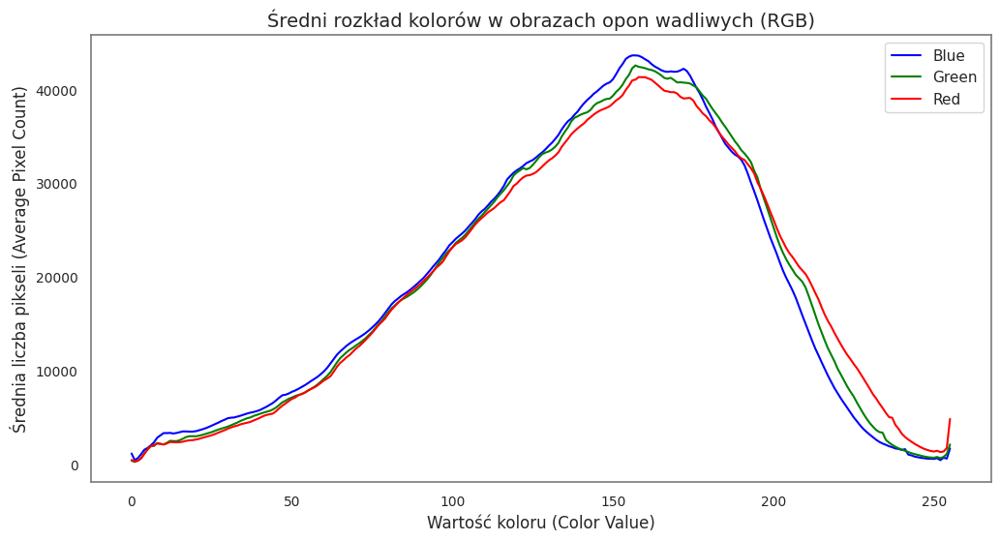

In [ ]:
plot_color_distribution_by_category(research_dataset_path)

Wnioski:
* Większość pikseli ma wartości w średnim zakresie (od 50 do 200), co wskazuje na ogólnie ciemne tło i oświetlenie.
* Brak znacznych różnic między kanałami RGB: Rozkład kanałów RGB jest bardzo podobny, co sugeruje, że zdjęcia są praktycznie monochromatyczne. Może to wynikać z charakteru zdjęć opon, które są w dominujących odcieniach szarości i czerni.
* Brak jaskrawych kolorów:

## Wstepne przygotowanie danych

In [ ]:
import os
from PIL import Image
import numpy as np
import shutil

In [ ]:
# Path to the research dataset folder
research_dataset_path = '/content/drive/My Drive/Magisterka/ResearchData'
processed_dataset_path = '/content/drive/My Drive/Magisterka/ProcessedData'

### Weryfikacja poprawnosci danych

In [ ]:
def verify_image_file(image_path):
    """
    Verifies if an image file is valid and not corrupted.
    Returns True if the image is valid, False otherwise.
    """
    try:
        with Image.open(image_path) as img:
            img.verify()  # Verify if image is not corrupted
        return True
    except (IOError, SyntaxError) as e:
        print(f"Corrupted image found: {image_path}. Error: {e}")
        return False


In [ ]:
def clean_corrupted_files(corrupted_files):
    """
    Deletes corrupted image files from the dataset.
    """
    for file_path in corrupted_files:
        try:
            os.remove(file_path)
            print(f"Deleted corrupted file: {file_path}")
        except Exception as e:
            print(f"Error deleting file {file_path}: {e}")

### Zmiana rozmiaru zdjęć


In [ ]:
def resize_image(image, target_size=(224, 224)):
    """
    Resizes the image to the target size.
    """
    # Resize the image
    img_resized = image.resize(target_size)
    return img_resized


In [ ]:
def save_image(image, save_path, image_name):
    """
    Saves  image to the specified save path.
    Ensures that the full directory structure exists.
    """
    try:
        # Ensure that the directory exists (create the full path if necessary)
        os.makedirs(save_path, exist_ok=True)  # Create directories recursively if they don't exist

        # Save the image in the specified path
        image.save(os.path.join(save_path, image_name))  # Save the image
    except Exception as e:
        print(f"Error saving image {image_name} to {save_path}: {e}")

In [ ]:
def resize_and_save_images_in_folder(folder_path, target_folder, target_size=(224, 224)):
    """
    Resizes images and saves them to a new folder structure.
    Also returns stats on how many images were processed and how many were corrupted.
    """
    corrupted_files = []
    processed_count = 0  # Counter for successfully processed images

    for category in ['good', 'defective']:
        category_path = os.path.join(folder_path, category)
        save_category_path = os.path.join(target_folder, category)  # Path to save resized images
        image_files = os.listdir(category_path)

        for image_name in image_files:
            image_path = os.path.join(category_path, image_name)

            # Verify if the image is valid
            if verify_image_file(image_path):
                try:
                    # Open the image
                    with Image.open(image_path) as img:
                        # Resize the image
                        resized_image = resize_image(img, target_size)

                        # Save the resized image to the new folder
                        save_image(resized_image, save_category_path, image_name)
                        processed_count += 1  # Increment counter for successful processing
                except Exception as e:
                    print(f"Error processing image {image_path}: {e}")
            else:
                # Add corrupted files to the list for later handling
                corrupted_files.append(image_path)

    return processed_count, len(corrupted_files)  # Return counts of processed and corrupted files

In [ ]:
# Resize the images and save to the new folder structure
processed_count, corrupted_count = resize_and_save_images_in_folder(research_dataset_path, processed_dataset_path, target_size=(224, 224))

# Print the results
print(f"Number of images successfully processed and saved: {processed_count}")
print(f"Number of corrupted images: {corrupted_count}")

Number of images successfully processed and saved: 3518
Number of corrupted images: 0


## Ładowanie danych, normalizacja, podzial

### Podział zbioru na treningowy, walidacyjny i testowy

In [ ]:
from sklearn.model_selection import train_test_split

def split_dataset(data, labels, test_size=0.15, val_size=0.15, random_state=42, stratify=True):
    """
    Splits the dataset into training, validation, and test sets with an option for stratified label distribution.

    Parameters:
    - data: array-like, input data (images).
    - labels: array-like, labels corresponding to the data.
    - test_size: proportion of the dataset to include in the test set (default is 15%).
    - val_size: proportion of the training set to include in the validation set (default is 15%).
    - random_state: seed for random number generator to ensure reproducibility (default is 42).
    - stratify: Boolean flag to apply stratification (default is True).

    Returns:
    - X_train, X_val, X_test: input data split into training, validation, and test sets.
    - y_train, y_val, y_test: corresponding labels for each split.
    """
    # Ustalanie wartości dla `stratify`
    stratify_labels = labels if stratify else None

    # First split: training+validation vs. test set with optional stratification
    X_train_val, X_test, y_train_val, y_test = train_test_split(
        data, labels, test_size=test_size, random_state=random_state, stratify=stratify_labels
    )

    # Adjust validation size relative to the remaining data
    val_relative_size = val_size / (1 - test_size)

    # Second split: training vs. validation set with optional stratification
    stratify_train_val = y_train_val if stratify else None
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, test_size=val_relative_size, random_state=random_state, stratify=stratify_train_val
    )

    return X_train, X_val, X_test, y_train, y_val, y_test

### Normalizacja

In [ ]:
def normalize_image(image):
    """
    Normalizes the pixel values of an image to the range [0, 1].
    """
    # Convert image to NumPy array
    img_array = np.array(image)

    # Normalize pixel values to the range [0, 1]
    img_normalized = img_array / 255.0

    return img_normalized


In [ ]:
import os
import numpy as np
from PIL import Image

def load_data(processed_data_path):
    """
    Loads images from the processed dataset, optionally normalizes them, and returns the data with labels.
    All images are converted to RGB format (3 channels) to ensure consistency.

    Parameters:
    - processed_data_path: Path to the directory containing processed images.

    Returns:
    - data: Array of images (optionally normalized).
    - labels: Array of corresponding labels.
    """
    data = []
    labels = []

    for category, label in [('good', 0), ('defective', 1)]:
        category_path = os.path.join(processed_data_path, category)
        image_files = os.listdir(category_path)

        for image_name in image_files:
            image_path = os.path.join(category_path, image_name)

            try:
                with Image.open(image_path) as img:
                    # Convert to RGB to ensure consistency in channels (3 channels)
                    img_rgb = img.convert('RGB')
                    img_array = np.array(img_rgb)
                    data.append(img_array)
                    labels.append(label)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")

    # Convert lists to NumPy arrays for further processing
    data = np.array(data)
    labels = np.array(labels)

    return data, labels


### Ładowanie danych

In [ ]:
# Load and normalize the data
processed_dataset_path = '/content/drive/My Drive/Magisterka/ProcessedData'
data, labels = load_data(processed_dataset_path)

# Print the shape of the data and labels for verification
print(f"Data shape: {data.shape}")
print(f"Labels shape: {labels.shape}")

Data shape: (3518, 224, 224, 3)
Labels shape: (3518,)


In [ ]:
print("Przykładowe wartości z pierwszego obrazu (pierwsze 10 pikseli):", data[0].flatten()[:10])
print("Etykieta pierwszego obrazu:", labels[0])

Przykładowe wartości z pierwszego obrazu (pierwsze 10 pikseli): [182 187 191 155 160 164 133 138 142 119]
Etykieta pierwszego obrazu: 0


In [ ]:
X_train, X_val, X_test, y_train, y_val, y_test = split_dataset(data, labels, random_state=42)

In [ ]:
import numpy as np
from collections import Counter

# Liczba przykładów w zbiorach treningowym, walidacyjnym i testowym
print(f"Training set size: {X_train.shape[0]}")
print(f"Validation set size: {X_val.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")

# Liczenie liczby przykładów w każdej klasie dla każdego zbioru
print("\nLiczba przykładów w każdej klasie:")

train_counts = Counter(y_train)
val_counts = Counter(y_val)
test_counts = Counter(y_test)

print("Zbiór treningowy:")
for label, count in train_counts.items():
    print(f"Klasa {label}: {count} przykładów")

print("\nZbiór walidacyjny:")
for label, count in val_counts.items():
    print(f"Klasa {label}: {count} przykładów")

print("\nZbiór testowy:")
for label, count in test_counts.items():
    print(f"Klasa {label}: {count} przykładów")

Training set size: 2462
Validation set size: 528
Test set size: 528

Liczba przykładów w każdej klasie:
Zbiór treningowy:
Klasa 1: 1303 przykładów
Klasa 0: 1159 przykładów

Zbiór walidacyjny:
Klasa 1: 280 przykładów
Klasa 0: 248 przykładów

Zbiór testowy:
Klasa 0: 248 przykładów
Klasa 1: 280 przykładów


In [ ]:
from torch.utils.data import Dataset, DataLoader, random_split

# Custom Dataset class using preloaded data
class PreloadedDataset(Dataset):
    def __init__(self, data, labels, transform=None):
        self.data = data
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image = self.data[idx]
        label = self.labels[idx]

        # Convert numpy array to PIL Image for transformations
        image = Image.fromarray(image.astype('uint8'), 'RGB')

        if self.transform:
            image = self.transform(image)

        return image, label

## Narzedzia do zarządzania, trenowania i oceny modeli

### Tensorflow

In [ ]:
!pip install tensorflow

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import os


In [ ]:
import os
import gc
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import backend as K

def train_model(model, train_generator, val_generator, epochs=40, save_folder='/content/drive/My Drive/Magisterka/Models',
                save_filename='best_model.keras', save_best_model=True, verbose=1):
    """
    Trains the model with early stopping, learning rate reduction, and optionally saves the best model.

    Parameters:
    - model: The compiled Keras model to train.
    - train_generator: Data generator for training data.
    - val_generator: Data generator for validation data.
    - epochs: Number of epochs to train for (default is 40).
    - save_folder: Directory where the model will be saved.
    - save_filename: Name of the saved model file.
    - save_best_model: Boolean indicating whether to save the best model.
    - verbose: Verbosity mode. 0 = silent, 1 = progress bar (default), 2 = one line per epoch.

    Returns:
    - history: Training history returned by model.fit().
    """
    # Ensure the save folder exists if saving is enabled
    if save_best_model and not os.path.exists(save_folder):
        os.makedirs(save_folder)

    # Full save path for the model
    save_path = os.path.join(save_folder, save_filename) if save_best_model else None

    # Early stopping to prevent overfitting and restore best weights
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', patience=3, factor=0.5, min_lr=1e-5, verbose=1)

    # Checkpoint to save the best model if enabled
    callbacks = [early_stopping, learning_rate_reduction]
    if save_best_model:
        checkpoint = ModelCheckpoint(save_path, monitor='val_loss', save_best_only=True, verbose=1)
        callbacks.append(checkpoint)

    # Train the model using the generators
    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=epochs,
        callbacks=callbacks,
        verbose=verbose  # Use the provided verbosity level
    )

    # Cleanup resources
    del callbacks
    K.clear_session()  # Clear TensorFlow session
    gc.collect()  # Force garbage collection

    return history


In [ ]:
import os
import tensorflow as tf

def save_model(model, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='final_model'):
    """
    Saves the trained model to the specified folder and filename.

    Parameters:
    - model: Trained Keras model to save.
    - save_folder: Directory where the model will be saved (default is '/content/drive/My Drive/Magisterka/Models').
    - save_filename: Name of the saved model file (without extension for TensorFlow SavedModel, with .keras or .h5 for other formats).
    """
    # Ensure the save folder exists
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    # Full save path for the model
    save_path = os.path.join(save_folder, save_filename)

    # Save the model based on the file extension or as SavedModel
    if save_filename.endswith('.keras') or save_filename.endswith('.h5'):
        model.save(save_path)  # Save as .keras or .h5 depending on the filename extension
    else:
        model.save(save_path)  # Save as TensorFlow SavedModel (no extension)

    print(f"Model saved to {save_path}")


In [ ]:
def convert_to_tflite(model):
    """
    Converts the Keras model to TensorFlow Lite format and returns the TFLite model.

    Parameters:
    - model: Trained Keras model to convert.

    Returns:
    - tflite_model: The converted TensorFlow Lite model in byte format.
    """
    # Convert the Keras model to TensorFlow Lite format
    converter = tf.lite.TFLiteConverter.from_keras_model(model)
    tflite_model = converter.convert()

    print("Model successfully converted to TensorFlow Lite format.")

    return tflite_model

In [ ]:
import os

def save_tflite_model(tflite_model, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='final_model.tflite'):
    """
    Saves the TensorFlow Lite model to the specified folder and filename.

    Parameters:
    - tflite_model: Converted TensorFlow Lite model in byte format.
    - save_folder: Directory where the TFLite model will be saved.
    - save_filename: Name of the saved TFLite model file.
    """
    # Ensure the save folder exists
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    # Full save path for the TFLite model
    save_path = os.path.join(save_folder, save_filename)

    # Save the TFLite model
    with open(save_path, 'wb') as f:
        f.write(tflite_model)

    print(f"TensorFlow Lite model saved to {save_path}")


In [ ]:
def evaluate_model(model, test_generator):
    """
    Evaluates the trained model on the test set and returns loss and accuracy in a dictionary.

    Parameters:
    - model: The trained Keras model to evaluate.
    - test_generator: Generator for test data.

    Returns:
    - results: Dictionary containing 'loss' and 'accuracy' from the evaluation.
    """
    # Ocena modelu na zbiorze testowym przy użyciu generatora
    loss, accuracy = model.evaluate(test_generator, verbose=1)

    # Wyświetlenie wyników
    print(f"Test Loss: {loss}")
    print(f"Test Accuracy: {accuracy}")

    # Zwróć wyniki jako słownik
    return {'loss': loss, 'accuracy': accuracy}


In [ ]:
def export_saved_model(model, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='saved_model'):
    """
    Exports the trained model as a TensorFlow SavedModel format.

    Parameters:
    - model: Trained Keras model to export.
    - save_folder: Directory where the model will be saved (default is '/content/drive/My Drive/Magisterka/Models').
    - save_filename: Name of the saved model directory (no extension required for SavedModel).
    """
    # Ensure the save folder exists
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    # Full save path for the model (no extension needed for SavedModel)
    save_path = os.path.join(save_folder, save_filename)

    # Export the model as a TensorFlow SavedModel
    tf.saved_model.save(model, save_path)
    print(f"Model exported to {save_path} as TensorFlow SavedModel.")

In [ ]:
def test_tflite_model(tflite_model_path, input_data):
    """
    Tests the converted TensorFlow Lite model with given input data.

    Parameters:
    - tflite_model_path: Path to the TensorFlow Lite model file.
    - input_data: Preprocessed input data for inference.

    Returns:
    - predictions: Output from the TensorFlow Lite model.
    """
    # Load the TensorFlow Lite model
    interpreter = tf.lite.Interpreter(model_path=tflite_model_path)
    interpreter.allocate_tensors()

    # Get input and output details
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    # Preprocess the input data to match the input tensor shape
    input_shape = input_details[0]['shape']
    input_data = input_data.reshape(input_shape).astype('float32')

    # Set the tensor input data
    interpreter.set_tensor(input_details[0]['index'], input_data)

    # Run the inference
    interpreter.invoke()

    # Get the output predictions
    predictions = interpreter.get_tensor(output_details[0]['index'])

    print("TFLite model inference completed.")
    return predictions


### Torch

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import torch

def evaluate_torch_model(model, dataloader, device):
    """
    Evaluates the model on the provided dataloader and calculates accuracy, precision, recall, and F1-score.

    Parameters:
    - model: Trained PyTorch model.
    - dataloader: DataLoader for the test or validation dataset.
    - device: Device to perform evaluation on ('cuda' for GPU or 'cpu').

    Returns:
    - metrics: Dictionary containing accuracy, precision, recall, and F1-score.
    """

    model.to(device)
    model.eval()

    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)

            # Collect all true labels and predictions
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    # Calculate metrics
    accuracy = accuracy_score(all_labels, all_predictions)
    precision = precision_score(all_labels, all_predictions, average='weighted')
    recall = recall_score(all_labels, all_predictions, average='weighted')
    f1 = f1_score(all_labels, all_predictions, average='weighted')

    metrics = {
        "accuracy": accuracy * 100,
        "precision": precision * 100,
        "recall": recall * 100,
        "f1_score": f1 * 100
    }

    # Print the results
    print(f"Accuracy: {metrics['accuracy']:.2f}%")
    print(f"Precision: {metrics['precision']:.2f}%")
    print(f"Recall: {metrics['recall']:.2f}%")
    print(f"F1 Score: {metrics['f1_score']:.2f}%")

    return metrics


In [ ]:
import torch
import os

def save_torch_model(model, save_path):
    """
    Saves the PyTorch (or timm) model to the specified path.

    Parameters:
    - model: The PyTorch model to save.
    - save_path: The path to save the model file (.pth format).
    """
    # Ensure the directory exists
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    # Save model state dictionary
    torch.save(model.state_dict(), save_path)
    print(f"Model saved to {save_path}")


def load_torch_model(model, load_path, device='cuda'):
    """
    Loads the PyTorch (or timm) model weights from a specified path.

    Parameters:
    - model: The PyTorch model instance (with the same architecture as the saved model).
    - load_path: The path from which to load the model file (.pth format).
    - device: Device to load the model to ('cuda' for GPU or 'cpu').

    Returns:
    - model: The model with loaded weights.
    """
    # Load model state dictionary and load to specified device
    model.load_state_dict(torch.load(load_path, map_location=device))
    model.to(device)
    print(f"Model loaded from {load_path}")
    return model

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

def train_torch_model(model, train_loader, val_loader, epochs=10, patience=5, learning_rate=1e-3,
                     save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='best_model.pth', device='cuda'):
    """
    Trains the model with early stopping, learning rate reduction, and saves the best model.

    Parameters:
    - model: The PyTorch model to train (compatible with timm or any other PyTorch model).
    - train_loader: DataLoader for training data.
    - val_loader: DataLoader for validation data.
    - epochs: Number of epochs to train for (default is 10).
    - patience: Number of epochs with no improvement after which training will be stopped.
    - learning_rate: Initial learning rate for the optimizer (default is 1e-3).
    - save_folder: Directory where the model will be saved.
    - save_filename: Name of the saved model file (default is 'best_model.pth').
    - device: Device to train on ('cuda' for GPU or 'cpu').

    Returns:
    - best_model: The model with the lowest validation loss.
    - training_history: Dictionary containing training and validation loss and accuracy history.
    """

    # Ensure the save folder exists
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    save_path = os.path.join(save_folder, save_filename)

    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, min_lr=1e-6, verbose=True)

    # Move model to device
    model.to(device)

    # Early stopping variables
    best_val_loss = float('inf')
    patience_counter = 0

    # To store the training history
    training_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        correct_train = 0
        total_train = 0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            # Accumulate train loss and correct predictions
            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        # Calculate average training loss and accuracy
        train_loss /= len(train_loader)
        train_acc = 100 * correct_train / total_train
        training_history['train_loss'].append(train_loss)
        training_history['train_acc'].append(train_acc)

        # Validation phase
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                # Accumulate validation loss and correct predictions
                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        # Calculate average validation loss and accuracy
        val_loss /= len(val_loader)
        val_acc = 100 * correct_val / total_val
        training_history['val_loss'].append(val_loss)
        training_history['val_acc'].append(val_acc)

        # Adjust learning rate based on validation loss
        scheduler.step(val_loss)

        # Display metrics for the current epoch
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Epoch [{epoch+1}/{epochs}], LR: {current_lr:.6f}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

        # Early stopping based on validation loss
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            torch.save(model.state_dict(), save_path)  # Save the best model
            print(f"Best model saved with val_loss: {best_val_loss:.4f}")
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss for {patience} consecutive epochs.")
            break

    # Load the best model before returning
    model.load_state_dict(torch.load(save_path))
    print("Training completed.")

    return model, training_history

## Inne narzedzie do eksperymentow

In [ ]:
import pandas as pd

def analyze_experiment_results(results, group_by='preprocessing'):
    """
    Analizuje wyniki eksperymentów, obliczając średnią dokładność i odchylenie standardowe
    dla każdej operacji przetwarzania wstępnego lub augmentacji.

    Args:
    - results: Lista słowników z wynikami (seed, preprocessing/augmentation, test_accuracy).
    - group_by: Kolumna, po której grupować wyniki (domyślnie 'preprocessing').

    Returns:
    - DataFrame z wynikami analizy (średnia, odchylenie standardowe).
    """
    # Konwersja wyników na DataFrame
    results_df = pd.DataFrame(results)

    # Grupowanie po wybranej kolumnie i obliczanie średniej i odchylenia standardowego
    summary = results_df.groupby(group_by)['test_accuracy'].agg(['mean', 'std']).reset_index()

    # Zmiana nazw kolumn dla czytelności
    summary.columns = [group_by.capitalize(), 'Średnia dokładność', 'Odchylenie standardowe']

    return summary


In [ ]:
def load_random_image(directory_path, seed=None):
    """
    Function to load a random image from a specified directory.

    Args:
    - directory_path: Path to the directory containing images.
    - seed: Optional seed for reproducibility.

    Returns:
    - A randomly selected image (PIL image).
    """
    # Set the seed for reproducibility if provided
    if seed is not None:
        random.seed(seed)

    # Get a list of all image files in the directory
    image_files = [file for file in os.listdir(directory_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

    if not image_files:
        raise ValueError("No image files found in the directory.")

    # Choose a random image
    random_image_path = os.path.join(directory_path, random.choice(image_files))

    # Load and return the image
    return Image.open(random_image_path)

In [ ]:
def load_image_from_path(image_path):
    """
    Function to load an image from a specified file path.

    Args:
    - image_path: Full path to the image file.

    Returns:
    - Loaded image (PIL image).
    """
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image file not found at path: {image_path}")

    # Load and return the image
    return Image.open(image_path)

In [ ]:
def create_resnet50_model():
    base_model = tf.keras.applications.ResNet50(include_top=False, weights='imagenet')
    base_model.trainable = False  # Zamrożenie wag modelu bazowego

    inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
    x = base_model(inputs)
    x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(512, activation="relu")(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

    model = tf.keras.Model(inputs, outputs, name="resnet50_model")
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

In [ ]:
from tensorflow.keras.applications import ConvNeXtTiny
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

def create_convnext_tiny_model():
    base_model = ConvNeXtTiny(include_top=False, weights='imagenet')
    base_model.trainable = False

    inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
    x = base_model(inputs)
    x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(1, activation="sigmoid", name="output_layer")(x)

    model = models.Model(inputs, outputs, name="convnext_tiny_model")
    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model


In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, Model
import tensorflow as tf

def create_mobilenetv2_model():
    # Załadowanie MobileNetV2 z wagami wstępnie wytrenowanymi na ImageNet
    base_model = MobileNetV2(include_top=False, weights='imagenet')
    base_model.trainable = False  # Zamrożenie wag modelu bazowego

    # Definicja wejść do modelu
    inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
    x = base_model(inputs)
    x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(512, activation="relu")(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

    # Stworzenie modelu końcowego
    model = tf.keras.Model(inputs, outputs, name="mobilenetv2_model")
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_processing_series(original_image, processed_images, process_titles, rows=None, cols=None,
                                target_size=(224, 224), label_bg_color=(0, 0, 0, 0.6),
                                label_text_color='white', label_fontsize=13, border_color='black', border_width=2):
    """
    Visualizes the original image and its processed versions with styled titles and borders.

    Args:
    - original_image: The original image (numpy array or PIL image).
    - processed_images: List of processed images (numpy arrays or PIL images).
    - process_titles: List of titles for each processing method applied.
    - rows: Number of rows for the plot (optional).
    - cols: Number of columns for the plot (optional). If not provided, automatically determined.
    - target_size: Tuple (width, height) to resize images.
    - label_bg_color: Background color for label (RGBA).
    - label_text_color: Text color for label.
    - label_fontsize: Font size for label text.
    - border_color: Color of the border.
    - border_width: Width of the border.
    """
    # Combine original and processed images
    images = [original_image] + processed_images
    titles = ["Oryginalne zdjęcie"] + process_titles

    # Determine the number of rows and columns
    total_images = len(images)
    if rows is None and cols is None:
        cols = 3  # Default: 3 columns
        rows = (total_images + cols - 1) // cols
    elif rows is None:
        rows = (total_images + cols - 1) // cols
    elif cols is None:
        cols = (total_images + rows - 1) // rows

    # Create the figure with smaller spacing
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4),
                             gridspec_kw={'wspace': 0.05, 'hspace': 0.05})  # Adjust wspace/hspace for spacing
    axes = axes.ravel()  # Flatten for easier iteration

    for i, (img, title) in enumerate(zip(images, titles)):
        # Resize image
        if isinstance(img, Image.Image):  # If PIL Image
            img = img.resize(target_size, Image.Resampling.LANCZOS)
        axes[i].imshow(img)
        axes[i].axis('off')  # Hide axes

        # Add a semi-transparent background for the label
        axes[i].add_patch(
            patches.Rectangle(
                (0, 0), 1, 0.12,  # Rectangle at the bottom
                color=label_bg_color,
                transform=axes[i].transAxes,
                zorder=1000
            )
        )

        # Add the label text
        axes[i].text(
            0.5, 0.06, title,
            fontsize=label_fontsize,
            color=label_text_color,
            weight='bold',
            ha='center',
            va='center',
            transform=axes[i].transAxes,
            zorder=1001
        )

        # Add a border around the image
        axes[i].add_patch(
            patches.Rectangle(
                (0, 0), 1, 1,  # Full axis rectangle
                linewidth=border_width,
                edgecolor=border_color,
                facecolor='none',
                transform=axes[i].transAxes,
                zorder=1002
            )
        )

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout(pad=1.0)  # Adjust padding for better layout
    plt.show()


In [ ]:
def visualize_processing(original_image, processed_image, title_original='Oryginalne zdjęcie', title_processed='Przetworzone zdjęcie',
                         label_bg_color=(0, 0, 0, 0.6), label_text_color='white', label_fontsize=13):
    fig, ax = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.15})

    # Plot original image
    ax[0].imshow(original_image)
    ax[0].axis('off')  # Hide axes and grid

    # Add a semi-transparent background for the label
    ax[0].add_patch(
        patches.Rectangle(
            (0, 0), 1, 0.12,  # Position and size in axis coordinates
            color=label_bg_color,
            transform=ax[0].transAxes,
            zorder=1000
        )
    )

    # Add the label text
    ax[0].text(
        0.5, 0.06, title_original,
        fontsize=label_fontsize,
        color=label_text_color,
        weight='bold',
        ha='center',
        va='center',
        transform=ax[0].transAxes,
        zorder=1001
    )

    # Plot processed image
    ax[1].imshow(processed_image)
    ax[1].axis('off')  # Hide axes and grid

    # Add a semi-transparent background for the label
    ax[1].add_patch(
        patches.Rectangle(
            (0, 0), 1, 0.12,  # Position and size in axis coordinates
            color=label_bg_color,
            transform=ax[1].transAxes,
            zorder=1000
        )
    )

    # Add the label text
    ax[1].text(
        0.5, 0.06, title_processed,
        fontsize=label_fontsize,
        color=label_text_color,
        weight='bold',
        ha='center',
        va='center',
        transform=ax[1].transAxes,
        zorder=1001
    )

    plt.tight_layout(pad=1.0)
    plt.show()


## Przetwarzanie wstepne - eksperymenty

### Definicja metod

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import gc

def run_preprocessing_experiments(data, labels, model_fn, random_seeds, preprocessing_operations,
                                   sample_percentage=0.5, epochs=80, batch_size=32, model_preprocessing=None):
    """
    Runs experiments with different preprocessing operations and random seeds.
    """
    results = []

    for seed in random_seeds:
        np.random.seed(seed)

        # Subsample data
        sample_size = int(len(data) * sample_percentage)
        indices = np.random.choice(len(data), size=sample_size, replace=False)
        sampled_data = data[indices]
        sampled_labels = labels[indices]

        # Split dataset
        X_train, X_val, X_test, y_train, y_val, y_test = split_dataset(sampled_data, sampled_labels, random_state=seed)

        for operation in preprocessing_operations:
            operation_name = operation['name']
            preprocessing_function = operation['function']

            def final_preprocessing_function(image):
                if preprocessing_function:
                    image = preprocessing_function(image)
                if model_preprocessing:
                    image = model_preprocessing(image)
                return image

            # Create data generators
            train_datagen = ImageDataGenerator(preprocessing_function=final_preprocessing_function)
            train_generator = train_datagen.flow(X_train, y_train, batch_size=batch_size)
            val_datagen = ImageDataGenerator(preprocessing_function=final_preprocessing_function)
            val_generator = val_datagen.flow(X_val, y_val, batch_size=batch_size)
            test_datagen = ImageDataGenerator(preprocessing_function=final_preprocessing_function)
            test_generator = test_datagen.flow(X_test, y_test, batch_size=batch_size)

            # Train model
            model = model_fn()
            history = train_model(
                model,
                train_generator,
                val_generator,
                epochs=epochs,
                save_best_model=False,
                verbose=0
            )

            # Evaluate model
            test_loss, test_acc = model.evaluate(test_generator, verbose=0)
            results.append({"seed": seed, "preprocessing": operation_name, "test_accuracy": test_acc})

            # Cleanup
            del history
            del train_generator, val_generator, test_generator
            del train_datagen, val_datagen, test_datagen
            del model
            tf.keras.backend.clear_session()
            tf.compat.v1.reset_default_graph()
            gc.collect()
        del X_train, X_val, X_test, y_train, y_val, y_test
        gc.collect()
    return results


In [ ]:
import albumentations as A
import albumentations.augmentations.functional as F
import cv2

def convert_to_grayscale(image):
    """Konwersja do skali szarości z zachowaniem 3 kanałów (RGB)."""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

def enhance_contrast(image):
    """
    Wzmocnienie kontrastu za pomocą CLAHE z zachowaniem oryginalnego typu danych i zakresu.

    Args:
    - image: Obraz wejściowy w formacie RGB (numpy array).

    Returns:
    - Obraz RGB z wzmocnionym kontrastem, przywrócony do oryginalnego typu danych.
    """
    # Sprawdzenie i zapisanie oryginalnego typu i zakresu
    original_dtype = image.dtype
    original_min, original_max = image.min(), image.max()

    # Konwersja obrazu na skalę szarości
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Konwersja na uint8, jeśli obraz ma inny typ danych
    if gray.dtype != np.uint8:
        gray = ((gray - gray.min()) / (gray.max() - gray.min()) * 255).astype(np.uint8)

    # Wzmocnienie kontrastu za pomocą CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_gray = clahe.apply(gray)

    # Konwersja z powrotem na RGB
    enhanced_rgb = cv2.cvtColor(enhanced_gray, cv2.COLOR_GRAY2RGB)

    # Przywrócenie oryginalnego typu danych i zakresu
    if original_dtype != np.uint8:
        enhanced_rgb = enhanced_rgb.astype(original_dtype)
        enhanced_rgb = enhanced_rgb / 255 * (original_max - original_min) + original_min

    return enhanced_rgb


def detect_edges_canny(image):
    """
    Detekcja krawędzi z nałożeniem na oryginalny obraz, z obsługą typu danych i zakresu.

    Args:
    - image: Obraz wejściowy w formacie RGB (numpy array).

    Returns:
    - Obraz RGB z nałożonymi krawędziami, w oryginalnym typie danych.
    """
    # Sprawdzenie i zapisanie oryginalnego typu i zakresu
    original_dtype = image.dtype
    original_min, original_max = image.min(), image.max()

    # Konwersja obrazu na skalę szarości
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Konwersja na uint8, jeśli obraz ma inny typ danych
    if gray.dtype != np.uint8:
        gray = ((gray - gray.min()) / (gray.max() - gray.min()) * 255).astype(np.uint8)

    # Detekcja krawędzi za pomocą Canny
    edges = cv2.Canny(gray, 100, 200)

    # Konwersja krawędzi na RGB
    edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Nałożenie krawędzi na oryginalny obraz (50% przezroczystości)
    overlay = cv2.addWeighted(image.astype(np.uint8), 0.7, edges_rgb, 0.3, 0)

    # Przywrócenie oryginalnego typu danych i zakresu
    if original_dtype != np.uint8:
        overlay = overlay.astype(original_dtype)
        overlay = overlay / 255 * (original_max - original_min) + original_min

    return overlay

def adaptive_threshold(image):
    """
    Segmentacja obrazu z użyciem progowania adaptacyjnego z przywróceniem oryginalnego typu danych.

    Args:
    - image: Obraz wejściowy w formacie RGB (numpy array).

    Returns:
    - Obraz RGB z progowaniem adaptacyjnym, przywrócony do oryginalnego typu danych.
    """
    # Sprawdzenie i zapisanie oryginalnego typu i zakresu danych
    original_dtype = image.dtype
    original_min, original_max = image.min(), image.max()

    # Konwersja do skali szarości
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Upewnienie się, że obraz jest w typie uint8
    if gray.dtype != np.uint8:
        gray = ((gray - gray.min()) / (gray.max() - gray.min()) * 255).astype(np.uint8)

    # Progowanie adaptacyjne
    thresh = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 15, 4
    )

    # Konwersja z powrotem do RGB
    thresh_rgb = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)

    # Przywrócenie oryginalnego typu danych i zakresu
    if original_dtype != np.uint8:
        thresh_rgb = thresh_rgb.astype(original_dtype)
        thresh_rgb = thresh_rgb / 255 * (original_max - original_min) + original_min

    return thresh_rgb


def equalize_histogram(image):
    """
    Wyrównanie histogramu dla poprawy kontrastu z przywróceniem oryginalnego typu danych.

    Args:
    - image: Obraz wejściowy w formacie RGB (numpy array).

    Returns:
    - Obraz RGB z wyrównanym histogramem, przywrócony do oryginalnego typu danych.
    """
    # Sprawdzenie i zapisanie oryginalnego typu i zakresu danych
    original_dtype = image.dtype
    original_min, original_max = image.min(), image.max()

    # Konwersja obrazu na skalę szarości
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Konwersja do uint8, jeśli obraz ma inny typ danych
    if gray.dtype != np.uint8:
        gray = ((gray - gray.min()) / (gray.max() - gray.min()) * 255).astype(np.uint8)

    # Wyrównanie histogramu
    equalized = cv2.equalizeHist(gray)

    # Konwersja z powrotem na RGB
    equalized_rgb = cv2.cvtColor(equalized, cv2.COLOR_GRAY2RGB)

    # Przywrócenie oryginalnego typu danych i zakresu
    if original_dtype != np.uint8:
        equalized_rgb = equalized_rgb.astype(original_dtype)
        equalized_rgb = equalized_rgb / 255 * (original_max - original_min) + original_min

    return equalized_rgb



/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


### Wizualizacje

In [ ]:
image_path = "/content/drive/My Drive/Magisterka/ResearchData/defective/Defective (67)_mendeley.jpg"
loaded_image = load_image_from_path(image_path)
loaded_image = np.array(loaded_image)

<ipython-input-30-00d0ceb682ce>:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.0)  # Adjust padding for better layout


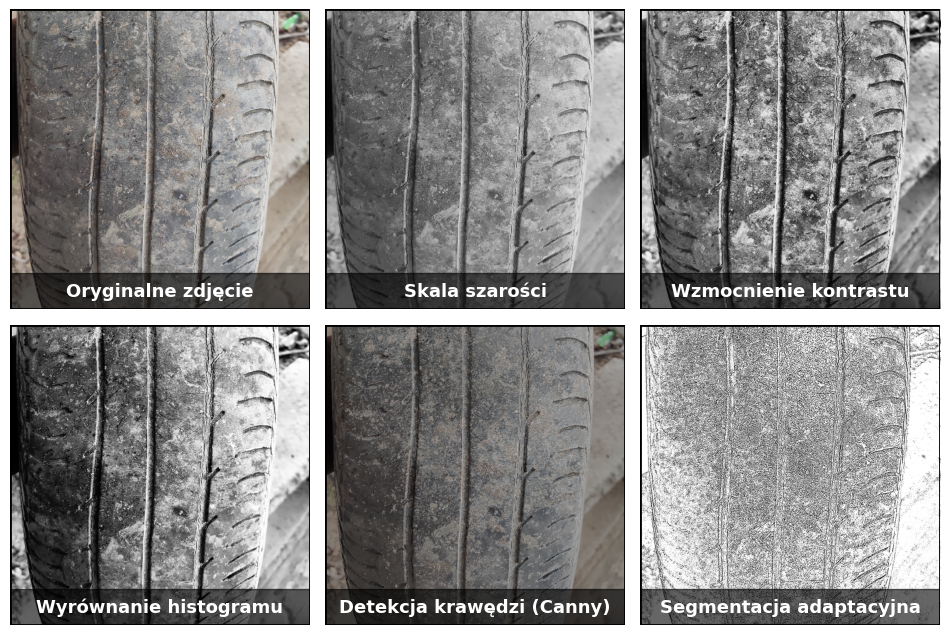

In [ ]:
# Przetworzenia
processed_images = [
    convert_to_grayscale(loaded_image),
    enhance_contrast(loaded_image),
    equalize_histogram(loaded_image),
    detect_edges_canny(loaded_image),
    adaptive_threshold(loaded_image),
]

# Tytuły
process_titles = [
    "Skala szarości",
    "Wzmocnienie kontrastu",
    "Wyrównanie histogramu",
    "Detekcja krawędzi (Canny)",
    "Segmentacja adaptacyjna",
]

# Wizualizacja
visualize_processing_series(
    loaded_image,
    processed_images,
    process_titles,
    rows=2,
    cols=3
)

### Eksperymenty

In [ ]:
random_seeds=[42, 24, 123, 99, 7]
processed_dataset_path = '/content/drive/My Drive/Magisterka/ProcessedData'
data, labels = load_data(processed_dataset_path)

In [ ]:
preprocessing_operations1 = [
    {"name": "No Preprocessing", "function": None},  # Brak przetwarzania wstępnego
    {"name": "Grayscale", "function": convert_to_grayscale},
    {"name": "Contrast Enhancement", "function": enhance_contrast},
]

preprocessing_operations2 = [
    {"name": "Canny Edges", "function": detect_edges_canny},
    {"name": "Adaptive Threshold", "function": adaptive_threshold},
    {"name": "Equalized Histogram", "function": equalize_histogram}
]


#### MobileNetV2

In [ ]:
from tensorflow.keras.applications import mobilenet_v2

results = run_preprocessing_experiments(
    data=data,
    labels=labels,
    model_fn=create_mobilenetv2_model,
    random_seeds=random_seeds,
    preprocessing_operations=preprocessing_operations1,
    sample_percentage=1,
    epochs=40,
    batch_size=16,
    model_preprocessing=mobilenet_v2.preprocess_input,
)

KeyboardInterrupt: 

In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary = analyze_experiment_results(results)

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary)


In [ ]:
from tensorflow.keras.applications import mobilenet_v2

results2 = run_preprocessing_experiments(
    data=data,
    labels=labels,
    model_fn=create_mobilenetv2_model,
    random_seeds=random_seeds,
    preprocessing_operations=preprocessing_operations2,
    sample_percentage=1,
    epochs=40,
    batch_size=16,
    model_preprocessing=mobilenet_v2.preprocess_input,
)

In [ ]:

# Analiza wyników eksperymentów
summary2 = analyze_experiment_results(results2)


print("Podsumowanie wyników eksperymentów:")
display(summary2)


#### ResNet50

In [ ]:
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

results = run_preprocessing_experiments(
    data=data,
    labels=labels,
    model_fn=create_resnet50_model,
    random_seeds=random_seeds,
    preprocessing_operations=preprocessing_operations1,
    sample_percentage=1,
    epochs=40,
    batch_size=16,
    model_preprocessing=resnet50_preprocess_input,
)


In [ ]:
# Analiza wyników eksperymentów
summary = analyze_experiment_results(results)

print("Podsumowanie wyników eksperymentów:")
display(summary)

In [ ]:
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

results = run_preprocessing_experiments(
    data=data,
    labels=labels,
    model_fn=create_resnet50_model,
    random_seeds=random_seeds,
    preprocessing_operations=preprocessing_operations2,
    sample_percentage=1,
    epochs=40,
    batch_size=16,
    model_preprocessing=resnet50_preprocess_input,
)


In [ ]:
# Analiza wyników eksperymentów
summary3 = analyze_experiment_results(results)

print("Podsumowanie wyników eksperymentów:")
display(summary3)

#### ConvNeXtTiny

In [ ]:
from tensorflow.keras.applications.convnext import ConvNeXtTiny, preprocess_input as convnext_tiny_preprocess_input

results5 = run_preprocessing_experiments(
    data=data,
    labels=labels,
    model_fn=create_convnext_tiny_model,
    random_seeds=random_seeds,
    preprocessing_operations=preprocessing_operations1,
    sample_percentage=1,
    epochs=40,
    batch_size=16,
    model_preprocessing=convnext_tiny_preprocess_input,
)


In [ ]:
# Analiza wyników eksperymentów
summary5 = analyze_experiment_results(results5)

print("Podsumowanie wyników eksperymentów:")
display(summary5)

In [ ]:
from tensorflow.keras.applications.convnext import ConvNeXtTiny, preprocess_input as convnext_tiny_preprocess_input

results6 = run_preprocessing_experiments(
    data=data,
    labels=labels,
    model_fn=create_convnext_tiny_model,
    random_seeds=random_seeds,
    preprocessing_operations=preprocessing_operations2,
    sample_percentage=1,
    epochs=40,
    batch_size=16,
    model_preprocessing=convnext_tiny_preprocess_input,
)


In [ ]:
# Analiza wyników eksperymentów
summary6 = analyze_experiment_results(results6)

print("Podsumowanie wyników eksperymentów:")
display(summary6)

## Augmentacja danych

### Definicje metod


In [ ]:
import albumentations as A

# Obrót obrazu w pełnym zakresie
# Losowy obrót w zakresie -180 do 180 stopni, co symuluje różne orientacje opon.
def augment_rotate(image):
    transform = A.Compose([A.Rotate(limit=180, p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]

  # Odbicie lustrzane obrazu
# Zawiera zarówno odbicie poziome, jak i pionowe z 50% prawdopodobieństwem.
def augment_flip(image):
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5)
    ])
    augmented = transform(image=image)
    return augmented["image"]

def augment_perspective(image):
    transform = A.Compose([A.Perspective(scale=(0.05, 0.1), p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]

# Rozmycie obrazu za pomocą filtru Gaussa
# Lekko rozmywa obraz, co może symulować zdjęcia z lekką nieostrością.
def augment_gaussian_blur(image):
    transform = A.Compose([A.GaussianBlur(blur_limit=(3, 7), p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]

# Zmiana jasności i kontrastu obrazu
def augment_brightness_contrast(image):
    transform = A.Compose([A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]

def augment_motion_blur(image):
    transform = A.Compose([A.MotionBlur(blur_limit=(3, 7), p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]


# CLAHE (Contrast Limited Adaptive Histogram Equalization)
# Poprawia kontrast na obrazie, co może uwidocznić szczegóły uszkodzeń.
def augment_clahe(image):
    transform = A.Compose([A.CLAHE(clip_limit=2.0, p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]


# Zmiana odcienia, nasycenia i wartości
# Uodparnia model na różnice kolorystyczne poprzez zmianę odcienia, nasycenia i jasności.
def augment_hue_saturation(image):
    transform = A.Compose([A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]

# Dodanie losowego szumu Gaussa
# Dodaje zakłócenia w formie szumu, co może pomóc modelowi w radzeniu sobie z zaszumionymi obrazami.
def augment_gaussian_noise(image):
    transform = A.Compose([A.GaussNoise(var_limit=(10.0, 50.0), p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]

def augment_fog(image):
    transform = A.Compose([A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=1, alpha_coef=0.08, p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]

def augment_snow(image):
    transform = A.Compose([A.RandomSnow(snow_point_lower=0.1, snow_point_upper=0.3, brightness_coeff=2.5, p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]


def augment_random_shadow(image):
    transform = A.Compose([A.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, shadow_dimension=8, p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]


# Przycięcie losowego fragmentu obrazu i przeskalowanie do oryginalnego rozmiaru
# Symuluje różne kadry obrazu, wycinając losowy fragment i przeskalowując go.
def augment_random_crop(image):
    transform = A.Compose([A.RandomResizedCrop(height=224, width=224, scale=(0.8, 1.0), p=0.5)])
    augmented = transform(image=image)
    return augmented["image"]

# Przycięcie centralnej części obrazu
# Wyodrębnia centralny fragment obrazu i przeskalowuje go do oryginalnego rozmiaru.
def augment_center_crop(image):
    transform = A.Compose([
        A.CenterCrop(height=200, width=200, p=0.5),
        A.Resize(height=224, width=224)  # Ensure output size matches model input
    ])
    augmented = transform(image=image)
    return augmented["image"]



def augment_cutout(image, max_holes=8, max_height=16, max_width=16, probability=0.5):
    transform = A.Compose([
        A.CoarseDropout(
            max_holes=max_holes,
            max_height=max_height,
            max_width=max_width,
            min_holes=1,  # Minimalna liczba dziur
            min_height=8,  # Minimalna wysokość dziur
            min_width=8,   # Minimalna szerokość dziur
            p=probability
        )
    ])
    augmented = transform(image=image)
    return augmented["image"]

def augment_channel_shuffle(image, probability=0.5):
    transform = A.Compose([
        A.ChannelShuffle(p=probability)
    ])
    augmented = transform(image=image)
    return augmented["image"]

def augment_random_rain(image, slant_lower=-10, slant_upper=10, drop_length=20, drop_width=1, drop_color=(200, 200, 200), blur_value=3, probability=0.5):
    transform = A.Compose([
        A.RandomRain(
            slant_lower=slant_lower,
            slant_upper=slant_upper,
            drop_length=drop_length,
            drop_width=drop_width,
            drop_color=drop_color,
            blur_value=blur_value,
            p=probability
        )
    ])
    augmented = transform(image=image)
    return augmented["image"]


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def run_augmentation_experiments(data, labels, model_fn, random_seeds, augmentations_list,
                                 sample_percentage=0.5, epochs=80, batch_size=32, model_preprocessing=None):
    """
    Runs experiments with different random seeds, augmentations, and optional model-specific preprocessing.

    Parameters:
    - data: The dataset to split (features).
    - labels: The labels for the dataset.
    - model_fn: A function that creates and returns a compiled Keras model.
    - random_seeds: List of random seeds for dataset splitting.
    - augmentations_list: List of dictionaries with 'name' and 'function' keys for augmentations.
    - sample_percentage: Percentage of the data to use in each experiment (default is 0.5).
    - epochs: Number of epochs to train for each experiment (default is 80).
    - batch_size: Batch size for the data generators (default is 32).
    - model_preprocessing: Optional preprocessing function specific to the model (e.g., mobilenet_v2.preprocess_input).

    Returns:
    - results: A list of dictionaries containing seed, augmentation name, and test accuracy.
    """
    results = []

    for seed in random_seeds:
        # Set the seed for reproducibility
        np.random.seed(seed)

        # Calculate the number of samples based on the specified percentage
        sample_size = int(len(data) * sample_percentage)

        # Randomly select a subset of the data
        indices = np.random.choice(len(data), size=sample_size, replace=False)
        sampled_data = data[indices]
        sampled_labels = labels[indices]

        # Split the sampled data into train, validation, and test sets
        X_train, X_val, X_test, y_train, y_val, y_test = split_dataset(sampled_data, sampled_labels, random_state=seed)

        for aug in augmentations_list:
            # Ustawienie funkcji augmentacji i nazwy
            aug_name = aug['name']
            augmentation_function = aug['function']

            # Zdefiniowanie funkcji końcowej do przetwarzania (preprocessing + augmentacja, jeśli są podane)
            def preprocessing_function(image):
                if model_preprocessing:
                    image = model_preprocessing(image)
                if augmentation_function:
                    image = augmentation_function(image)
                return image

            # Tworzenie generatora treningowego z przekazaną funkcją augmentacyjną
            train_datagen = ImageDataGenerator(preprocessing_function=preprocessing_function)
            train_generator = train_datagen.flow(X_train, y_train, batch_size=batch_size)

            # Generatory walidacyjny i testowy tylko z modelowym preprocessingiem
            val_datagen = ImageDataGenerator(preprocessing_function=model_preprocessing)
            test_datagen = ImageDataGenerator(preprocessing_function=model_preprocessing)

            val_generator = val_datagen.flow(X_val, y_val, batch_size=batch_size)
            test_generator = test_datagen.flow(X_test, y_test, batch_size=batch_size)

            # Create and compile the model
            model = model_fn()

            # Train the model using a training function
            history = train_model(
                model,
                train_generator,
                val_generator,
                epochs=epochs,
                save_best_model=False,
                verbose=0
            )

            # Evaluate the model on the test set
            test_loss, test_acc = model.evaluate(test_generator, verbose=0)
            results.append({"seed": seed, "augmentation": aug_name, "test_accuracy": test_acc})

            # Cleanup
            del history
            del train_generator, val_generator, test_generator
            del train_datagen, val_datagen, test_datagen
            del model
            tf.keras.backend.clear_session()
            tf.compat.v1.reset_default_graph()
            gc.collect()

        # Cleanup split data
        del X_train, X_val, X_test, y_train, y_val, y_test
        gc.collect()

    return results


### Wizualizacje


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import numpy as np
import random

processed_dataset_path = '/content/drive/My Drive/Magisterka/ResearchData'
good_images_path = os.path.join(processed_dataset_path, "good")

In [ ]:
random_image = load_random_image(good_images_path, seed=33)
random_image = np.array(random_image)

KeyboardInterrupt: 

#### Rotacja obrazu


Rotacja obrazu jest jedną z najczęściej stosowanych technik augmentacji danych. Nawet jeśli obrócimy zdjęcie, informacja na obrazie pozostaje taka sama.

In [ ]:
import albumentations as A

def augment_rotate_90_vis(image):
    transform = A.Compose([A.Rotate(limit=(90, 90), p=1.0)])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
rotated_image = augment_rotate_90_vis(random_image)

# Visualizing the original and rotated image
visualize_processing(random_image, rotated_image, title_original='Oryginalne zdjęcie', title_processed='Obrócone zdjęcie o 90° ')

#### Odbicie lustrzane (Flip)

Odbicie lustrzane (poziome lub pionowe) to prosta, ale efektywna metoda augmentacji, szczególnie przy obrazach, gdzie orientacja obiektu nie wpływa na klasyfikację.

In [ ]:
import numpy as np

def flip_image(image, mode='horizontal'):
    if mode == 'horizontal':
        return np.fliplr(image)
    elif mode == 'vertical':
        return np.flipud(image)
    else:
        raise ValueError("Invalid mode. Use 'horizontal' or 'vertical'.")

In [ ]:
flipped_horizontal = flip_image(random_image, mode='horizontal')
visualize_processing(random_image, flipped_horizontal, title_original='Oryginalne zdjęcie', title_processed='Odbicie poziome')

flipped_vertical = flip_image(random_image, mode='vertical')
visualize_processing(random_image, flipped_vertical, title_original='Oryginalne zdjęcie', title_processed='Odbicie pionowe')


#### Zmiana perspektywy


In [ ]:
import albumentations as A

def augment_perspective_vis(image, scale=(0, 0.1), keep_size=True):
    transform = A.Compose([
        A.Perspective(scale=scale, keep_size=keep_size, p=1.0)
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
perspective_image = augment_perspective_vis(random_image)
visualize_processing(random_image, perspective_image, title_original='Oryginalne zdjęcie', title_processed='Perspektywa')


#### Rozmycie Gaussowskie

Zastosowanie filtra Gaussowskiego do wygładzenia obrazu i redukcji szumów.

In [ ]:
import albumentations as A

def augment_gaussian_blur_vis(image, blur_limit=(1, 7)):
    transform = A.Compose([
        A.GaussianBlur(blur_limit=blur_limit, p=1.0)
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
gaussian_blur_image = augment_gaussian_blur_vis(random_image)
visualize_processing(random_image, gaussian_blur_image, title_original='Oryginalne zdjęcie', title_processed='Rozmycie Gaussowskie')


#### Rozmycie ruchu

In [ ]:
import albumentations as A

def augment_motion_blur_vis(image, blur_limit=(3, 7)):
    transform = A.Compose([
        A.MotionBlur(blur_limit=blur_limit, p=1.0)
    ])
    augmented = transform(image=image)
    return augmented["image"]

In [ ]:
motion_blur_image = augment_motion_blur_vis(random_image)
visualize_processing(random_image, motion_blur_image, title_original='Oryginalne zdjęcie', title_processed='Rozmycie ruchu')


#### Zmiana jasnosci i kontrastu

In [ ]:
def augment_brightness_contrast_vis(image):
    transform = A.Compose([A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1)])
    augmented = transform(image=image)
    return augmented["image"]

In [ ]:
brightness_contrast_image = augment_brightness_contrast_vis(random_image)
visualize_processing(random_image, brightness_contrast_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Zmiana jasności i kontrastu')


#### Adaptacyjna wyrównanie histogramu (CLAHE)

Zastosowanie adaptacyjnej metody wyrównania histogramu CLAHE do poprawy kontrastu obrazu.

In [ ]:
def augment_clahe_vis(image, clip_limit=2.0, tile_grid_size=(8, 8), probability=1.0):
    transform = A.Compose([
        A.CLAHE(clip_limit=clip_limit, tile_grid_size=tile_grid_size, p=probability)
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
clahe_image = augment_clahe_vis(random_image)
visualize_processing(random_image, clahe_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Adaptacyjne wyrównanie histogramu (CLAHE)', label_fontsize=11)


#### Modyfikacja odcienia, nasycenia i jasności

Zmiana odcienia, nasycenia i wartości jasności obrazu w określonym zakresie

In [ ]:
def augment_hue_saturation_value_vis(image, hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, probability=1.0):
    transform = A.Compose([
        A.HueSaturationValue(
            hue_shift_limit=hue_shift_limit,
            sat_shift_limit=sat_shift_limit,
            val_shift_limit=val_shift_limit,
            p=probability
        )
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
hue_saturation_value_image = augment_hue_saturation_value_vis(random_image)
visualize_processing(random_image, hue_saturation_value_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Modyfikacja odcienia, nasycenia i jasności',label_fontsize=12)


#### Dodanie szumu Gaussowskiego

In [ ]:
def augment_gauss_noise_vis(image, var_limit=(10.0, 50.0), mean=0, probability=1.0):
    transform = A.Compose([
        A.GaussNoise(var_limit=var_limit, mean=mean, p=probability)
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
gauss_noise_image = augment_gauss_noise_vis(random_image)
visualize_processing(random_image, gauss_noise_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Szum Gaussowski')


#### Dodanie efektu sniegu

In [ ]:
def augment_random_snow_vis(image, snow_point_range=(0.1, 0.3), brightness_coeff=2.5, probability=1.0):
    transform = A.Compose([
        A.RandomSnow(snow_point_lower=snow_point_range[0], snow_point_upper=snow_point_range[1],
                     brightness_coeff=brightness_coeff, p=probability)
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
snow_image = augment_random_snow_vis(random_image)
visualize_processing(random_image, snow_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Efekt śniegu')


#### Dodanie efektu cienia


In [ ]:
def augment_random_shadow_vis(image, shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, shadow_dimension=5, probability=1.0):
    transform = A.Compose([
        A.RandomShadow(shadow_roi=shadow_roi,
                       num_shadows_lower=num_shadows_lower,
                       num_shadows_upper=num_shadows_upper,
                       shadow_dimension=shadow_dimension,
                       p=probability)
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
shadow_image = augment_random_shadow_vis(random_image)
visualize_processing(random_image, shadow_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Efekt cienia')


#### Losowe przycięcie i zmiana rozmiaru

In [ ]:
def augment_random_crop(image, height=224, width=224, scale=(0.8, 1.0), probability=1):
    transform = A.Compose([
        A.RandomResizedCrop(height=height, width=width, scale=scale, p=probability)
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
random_crop_image = augment_random_crop(random_image)
visualize_processing(random_image, random_crop_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Losowe przycięcie')


#### Przycięcie centralne i zmiana rozmiaru

In [ ]:
def augment_center_crop_and_resize(image, crop_height=2000, crop_width=2000, resize_height=224, resize_width=224, probability=1):
    transform = A.Compose([
        A.CenterCrop(height=crop_height, width=crop_width, p=probability),
        A.Resize(height=resize_height, width=resize_width)
    ])
    augmented = transform(image=image)
    return augmented["image"]

In [ ]:
center_crop_image = augment_center_crop_and_resize(random_image)
visualize_processing(random_image, center_crop_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Centralne przycięcie i zmiana rozmiaru')


#### Losowe wycięcia (Cutout)

In [ ]:
def augment_cutout_vis(image, max_holes=10, max_height=400, max_width=400, probability=1):
    transform = A.Compose([
        A.CoarseDropout(
            max_holes=max_holes,
            max_height=max_height,
            max_width=max_width,
            min_holes=1,  # Minimalna liczba dziur
            min_height=8,  # Minimalna wysokość dziur
            min_width=8,   # Minimalna szerokość dziur
            p=probability
        )
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
cutout_image = augment_cutout_vis(random_image)
visualize_processing(random_image, cutout_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Losowe wycięcia')


#### Dodanie efektu deszczu

In [ ]:
def augment_random_rain_vis(image, slant_lower=-10, slant_upper=10, drop_length=20, drop_width=1, drop_color=(200, 200, 200), blur_value=3, probability=1):
    transform = A.Compose([
        A.RandomRain(
            slant_lower=slant_lower,
            slant_upper=slant_upper,
            drop_length=drop_length,
            drop_width=drop_width,
            drop_color=drop_color,
            blur_value=blur_value,
            p=probability
        )
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
rain_image = augment_random_rain_vis(random_image)
visualize_processing(random_image, rain_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Efekt deszczu')


In [ ]:
def augment_channel_shuffle_vis(image, probability=1):
    transform = A.Compose([
        A.ChannelShuffle(p=probability)
    ])
    augmented = transform(image=image)
    return augmented["image"]


In [ ]:
channel_shuffle_image = augment_channel_shuffle_vis(random_image)
visualize_processing(random_image, channel_shuffle_image,
                     title_original='Oryginalne zdjęcie',
                     title_processed='Przemieszanie kanałów kolorów')


Eksperymenty - porownanie

### Glowna wizualizacja


In [ ]:
random_image = load_random_image(good_images_path, seed=33)
random_image = np.array(random_image)

In [ ]:
augmentations = [
    augment_rotate_90_vis,
    lambda img: flip_image(img, mode='vertical'),
    augment_perspective_vis,
    augment_gaussian_blur_vis,
    augment_motion_blur_vis,
    augment_brightness_contrast_vis,
    augment_clahe_vis,
    augment_gauss_noise_vis,
    augment_random_snow_vis,
    augment_random_shadow_vis,
    augment_random_crop,
    augment_center_crop_and_resize,
    augment_cutout_vis,
    augment_random_rain_vis
]

# Tytuły dla każdego przetworzenia
augmentation_titles = [
    "Rotacja o 90°",
    "Odbicie pionowe",
    "Zmiana perspektywy",
    "Rozmycie Gaussowskie",
    "Rozmycie ruchu",
    "Jasność i kontrast",
    "CLAHE",
    "Szum Gaussowski",
    "Efekt śniegu",
    "Efekt cienia",
    "Losowe przycięcie",
    "Centralne przycięcie",
    "Cutout",
    "Efekt deszczu"
]

<ipython-input-30-c471dd5f2799>:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.0)  # Adjust padding for better layout


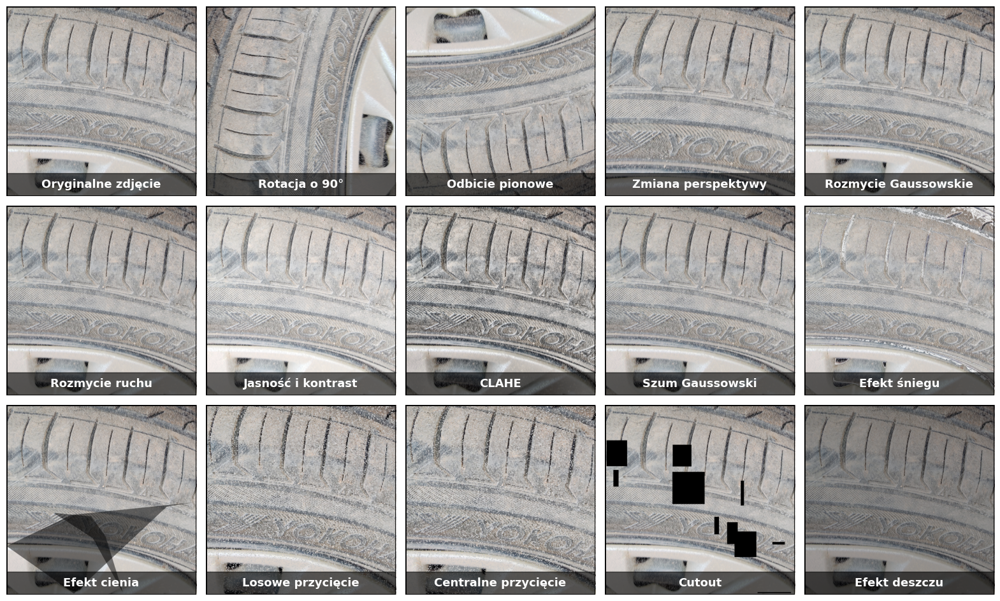

In [ ]:
augmented_images = [aug(random_image) for aug in augmentations]

# Wizualizacja serii
visualize_processing_series(random_image, augmented_images, augmentation_titles, rows=3, cols=5)

### Eksperymenty



In [ ]:
random_seeds=[42, 24, 123, 99, 7]
processed_dataset_path = '/content/drive/My Drive/Magisterka/ProcessedData'
data, labels = load_data(processed_dataset_path)

In [ ]:
augmentations_list_1 = [
    {"name": "No Augmentation", "function": None},
    {"name": "Rotate", "function": augment_rotate},
    {"name": "Flip", "function": augment_flip},
    {"name": "Perspective", "function": augment_perspective}
]

augmentations_list_2 = [
    {"name": "Gaussian Blur", "function": augment_gaussian_blur},
    {"name": "Brightness Contrast", "function": augment_brightness_contrast},
    {"name": "Motion Blur", "function": augment_motion_blur}
]

augmentations_list_3 = [
    {"name": "CLAHE", "function": augment_clahe},
    {"name": "Gaussian Noise", "function": augment_gaussian_noise},
    {"name": "Center Crop", "function": augment_center_crop},
    {"name": "Cutout", "function": augment_cutout},
]

augmentations_list_4 = [
    {"name": "Rain", "function": augment_random_rain},
    {"name": "Snow", "function": augment_snow},
    {"name": "Shadow", "function": augment_random_shadow},
    {"name": "Random Crop", "function": augment_random_crop},
]



#### MobileNetV2


In [ ]:
from tensorflow.keras.applications import mobilenet_v2


results1_mob = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_mobilenetv2_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_1,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=mobilenet_v2.preprocess_input
)


In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary1_mob = analyze_experiment_results(results1_mob, group_by='augmentation')

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary1_mob)


Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Flip,0.902273,0.020643
1,No Augmentation,0.906061,0.035066
2,Perspective,0.918939,0.025494
3,Rotate,0.907576,0.022184


In [ ]:
from tensorflow.keras.applications import mobilenet_v2


results2_mob = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_mobilenetv2_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_2,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=mobilenet_v2.preprocess_input
)

In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary2_mob = analyze_experiment_results(results2_mob, group_by='augmentation')

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary2_mob)


Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Brightness Contrast,0.905303,0.027964
1,Gaussian Blur,0.911364,0.026596
2,Motion Blur,0.915909,0.036470


In [ ]:
from tensorflow.keras.applications import mobilenet_v2


results3_mob = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_mobilenetv2_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_3,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=mobilenet_v2.preprocess_input
)

In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary3_mob = analyze_experiment_results(results3_mob, group_by='augmentation')

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary3_mob)


Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,CLAHE,0.909091,0.024402
1,Gaussian Noise,0.906061,0.034028
2,Hue Saturation,0.900000,0.031074


In [ ]:
from tensorflow.keras.applications import mobilenet_v2


results4_mob = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_mobilenetv2_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_4,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=mobilenet_v2.preprocess_input
)

In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary4_mob = analyze_experiment_results(results4_mob, group_by='augmentation')

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary4_mob)


Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Fog,0.902273,0.028015
1,Rain,0.903788,0.029898
2,Shadow,0.907576,0.023595
3,Snow,0.907576,0.028673


In [ ]:
from tensorflow.keras.applications import mobilenet_v2

results5_mob = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_mobilenetv2_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_5,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=mobilenet_v2.preprocess_input
)

In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary5_mob = analyze_experiment_results(results5_mob, group_by='augmentation')

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary5_mob)


Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Center Crop,0.912879,0.025691
1,Channel Shuffle,0.906818,0.025353
2,Cutout,0.911364,0.021192
3,Random Crop,0.912121,0.029754


#### ResNet50


In [ ]:
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

results1_res = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_resnet50_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_1,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=resnet50_preprocess_input,
)



In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary1_res = analyze_experiment_results(results1_res, group_by='augmentation')

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary1_res)


Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Flip,0.939394,0.014913
1,No Augmentation,0.937121,0.011237
2,Perspective,0.940152,0.017441
3,Rotate,0.949242,0.018087


In [ ]:
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

results2_res = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_resnet50_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_2,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=resnet50_preprocess_input,
)



In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary2_res = analyze_experiment_results(results2_res, group_by='augmentation')

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary2_res)


Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Brightness Contrast,0.934848,0.011797
1,Gaussian Blur,0.934091,0.017887
2,Motion Blur,0.931061,0.016812


In [ ]:
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

results3_res = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_resnet50_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_3,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=resnet50_preprocess_input,
)



In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary3_res = analyze_experiment_results(results3_res, group_by='augmentation')

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary3_res)


Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,CLAHE,0.925000,0.015479
1,Center Crop,0.931061,0.016380
2,Cutout,0.931061,0.022632
3,Gaussian Noise,0.940152,0.013762


In [ ]:
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

results4_res = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_resnet50_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_4,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=resnet50_preprocess_input,
)



In [ ]:
import pandas as pd

# Analiza wyników eksperymentów
summary4_res = analyze_experiment_results(results4_res, group_by='augmentation')

# Wyświetlenie wyników w formie tabeli
print("Podsumowanie wyników eksperymentów:")
display(summary4_res)


Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Rain,0.928030,0.030656
1,Random Crop,0.939394,0.011978
2,Shadow,0.940152,0.012098
3,Snow,0.929545,0.013814


#### ConvNeXtTiny


In [ ]:
from tensorflow.keras.applications.convnext import ConvNeXtTiny, preprocess_input as convnext_tiny_preprocess_input

results1_conv = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_convnext_tiny_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_1,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=convnext_tiny_preprocess_input,
)


In [ ]:
summary1_conv = analyze_experiment_results(results1_conv, group_by='augmentation')
print("Podsumowanie wyników eksperymentów:")
display(summary1_conv)

Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Flip,0.924242,0.027183
1,No Augmentation,0.923485,0.016812
2,Perspective,0.936364,0.016598
3,Rotate,0.933333,0.010913


In [ ]:
from tensorflow.keras.applications.convnext import ConvNeXtTiny, preprocess_input as convnext_tiny_preprocess_input

results2_conv = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_convnext_tiny_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_2,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=convnext_tiny_preprocess_input,
)


In [ ]:
summary2_conv = analyze_experiment_results(results2_conv, group_by='augmentation')
print("Podsumowanie wyników eksperymentów:")
display(summary2_conv)

Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Brightness Contrast,0.912121,0.024165
1,Gaussian Blur,0.927273,0.023867
2,Motion Blur,0.918939,0.019053


In [ ]:
from tensorflow.keras.applications.convnext import ConvNeXtTiny, preprocess_input as convnext_tiny_preprocess_input

results3_conv = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_convnext_tiny_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_3,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=convnext_tiny_preprocess_input,
)


In [ ]:
summary3_conv = analyze_experiment_results(results3_conv, group_by='augmentation')
print("Podsumowanie wyników eksperymentów:")
display(summary3_conv)

Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,CLAHE,0.926515,0.014572
1,Center Crop,0.928030,0.015152
2,Cutout,0.921970,0.015293
3,Gaussian Noise,0.922727,0.026596


In [ ]:
from tensorflow.keras.applications.convnext import ConvNeXtTiny, preprocess_input as convnext_tiny_preprocess_input

results4_conv = run_augmentation_experiments(
    data=data,
    labels=labels,
    model_fn=create_convnext_tiny_model,
    random_seeds=random_seeds,
    augmentations_list=augmentations_list_4,
    sample_percentage=0.5,
    epochs=40,
    batch_size=16,
    model_preprocessing=convnext_tiny_preprocess_input,
)


111650432/111650432 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 11: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 9: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 11: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 11: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 16: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.

Epoch 9: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 15: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 14: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 9: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 9: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 17: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.


In [ ]:
summary4_conv = analyze_experiment_results(results4_conv, group_by='augmentation')
print("Podsumowanie wyników eksperymentów:")
display(summary4_conv)

Podsumowanie wyników eksperymentów:


,Augmentation,Średnia dokładność,Odchylenie standardowe
0,Rain,0.921212,0.016812
1,Random Crop,0.931061,0.031051
2,Shadow,0.915152,0.022184
3,Snow,0.914394,0.018863


#### Eksperymenty - Kombinacje

## Modele


In [ ]:
# Importing necessary libraries and modules
import warnings  # Import the 'warnings' module for handling warnings
warnings.filterwarnings("ignore")  # Ignore warnings during execution

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import tensorflow as tf

import torch  # Import PyTorch for deep learning
from torch.utils.data import DataLoader  # For creating data loaders
from torchvision.transforms import (  # Import image transformation functions
    CenterCrop,  # Center crop an image
    Compose,  # Compose multiple image transformations
    Normalize,  # Normalize image pixel values
    RandomRotation,  # Apply random rotation to images
    RandomResizedCrop,  # Crop and resize images randomly
    RandomHorizontalFlip,  # Apply random horizontal flip
    RandomAdjustSharpness,  # Adjust sharpness randomly
    Resize,  # Resize images
    ToTensor  # Convert images to PyTorch tensors
)

### EfficientNetB0

In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie EfficientNetB0 z wagami z ImageNet
base_model_efficientnet = EfficientNetB0(include_top=False, weights='imagenet')
base_model_efficientnet.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_efficientnet(inputs)

# Global average pooling, Flatten i Dense
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = tf.keras.layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = tf.keras.layers.Dense(512, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_efficientnet = tf.keras.Model(inputs, outputs, name="efficientnet_model")

In [ ]:
# Kompilacja modelu
model_efficientnet.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_efficientnet.summary()

Model: "efficientnet_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,705,956 (17.95 MB)

 Trainable params: 656,385 (2.50 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
# Generatory danych z normalizacją dla EfficientNet
train_datagen_efficientnet = ImageDataGenerator(
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_efficientnet = ImageDataGenerator()
test_datagen_efficientnet = ImageDataGenerator()

batch_size = 16

# Przygotowanie generatorów danych
train_generator_efficientnet = train_datagen_efficientnet.flow(X_train, y_train, batch_size=batch_size)
val_generator_efficientnet = val_datagen_efficientnet.flow(X_val, y_val, batch_size=batch_size)
test_generator_efficientnet = test_datagen_efficientnet.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
# Trenowanie modelu EfficientNet
history = train_model(
    model_efficientnet,
    train_generator_efficientnet,
    val_generator_efficientnet,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='efficientnet_best_model.keras'
)

Epoch 1/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.8462 - loss: 0.3591
Epoch 1: val_loss improved from inf to 0.18863, saving model to /content/drive/My Drive/Magisterka/Models/efficientnet_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - accuracy: 0.8465 - loss: 0.3586 - val_accuracy: 0.9167 - val_loss: 0.1886 - learning_rate: 0.0010
Epoch 2/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.8858 - loss: 0.2660
Epoch 2: val_loss did not improve from 0.18863
154/154 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - accuracy: 0.8860 - loss: 0.2658 - val_accuracy: 0.9053 - val_loss: 0.2011 - learning_rate: 0.0010
Epoch 3/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.9296 - loss: 0.1918
Epoch 3: val_loss improved from 0.18863 to 0.16407, saving model to /content/drive/My Drive/Magisterka/Models/efficientnet_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - accuracy: 0.9295 - loss: 0.1922 - val_accuracy: 0.9280 - val_loss: 0.1641 - lea

In [ ]:
 evaluate_model(model_efficientnet, test_generator_efficientnet)

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9519 - loss: 0.1118
Test Loss: 0.12363455444574356
Test Accuracy: 0.9526515007019043


{'loss': 0.12363455444574356, 'accuracy': 0.9526515007019043}

### EfficientNetV2S


In [ ]:
from tensorflow.keras.applications import EfficientNetV2S
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie EfficientNetV2S z wagami wstępnie wytrenowanymi na ImageNet
base_model_efficientnetv2 = EfficientNetV2S(include_top=False, weights='imagenet')
base_model_efficientnetv2.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_efficientnetv2(inputs)

# Global average pooling, Flatten i Dense
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = tf.keras.layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = tf.keras.layers.Dense(512, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_efficientnetv2 = tf.keras.Model(inputs, outputs, name="efficientnetv2_model")


In [ ]:
# Kompilacja modelu
model_efficientnetv2.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
model_efficientnetv2.summary()

Model: "efficientnetv2_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-s (Functional)        │ (None, 7, 7, 1280)          │      20,331,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,987,745 (80.06 MB)

 Trainable params: 656,385 (2.50 MB)

 Non-trainable params: 20,331,360 (77.56 MB)

In [ ]:
# Generatory danych z normalizacją dla EfficientNetV2
train_datagen_efficientnetv2 = ImageDataGenerator(
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_efficientnetv2 = ImageDataGenerator()
test_datagen_efficientnetv2 = ImageDataGenerator()

batch_size = 16

# Przygotowanie generatorów danych
train_generator_efficientnetv2 = train_datagen_efficientnetv2.flow(X_train, y_train, batch_size=batch_size)
val_generator_efficientnetv2 = val_datagen_efficientnetv2.flow(X_val, y_val, batch_size=batch_size)
test_generator_efficientnetv2 = test_datagen_efficientnetv2.flow(X_test, y_test, batch_size=batch_size)

In [ ]:
# Trenowanie modelu EfficientNetV2S
history = train_model(
    model_efficientnetv2,
    train_generator_efficientnetv2,
    val_generator_efficientnetv2,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='efficientnetv2_best_model.keras'
)

Epoch 1/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.8063 - loss: 0.4230
Epoch 1: val_loss improved from inf to 0.32341, saving model to /content/drive/My Drive/Magisterka/Models/efficientnetv2_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 98s 356ms/step - accuracy: 0.8065 - loss: 0.4226 - val_accuracy: 0.8485 - val_loss: 0.3234 - learning_rate: 0.0010
Epoch 2/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.8837 - loss: 0.2725
Epoch 2: val_loss improved from 0.32341 to 0.24589, saving model to /content/drive/My Drive/Magisterka/Models/efficientnetv2_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - accuracy: 0.8838 - loss: 0.2725 - val_accuracy: 0.8977 - val_loss: 0.2459 - learning_rate: 0.0010
Epoch 3/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.9003 - loss: 0.2583
Epoch 3: val_loss improved from 0.24589 to 0.20891, saving model to /content/drive/My Drive/Magisterka/Models/efficientnetv2_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━

In [ ]:
 evaluate_model(model_efficientnetv2, test_generator_efficientnetv2)

33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9394 - loss: 0.1379
Test Loss: 0.12231455743312836
Test Accuracy: 0.9488636255264282


{'loss': 0.12231455743312836, 'accuracy': 0.9488636255264282}

### MobileNet

In [ ]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie MobileNet (V1) z wagami wstępnie wytrenowanymi na ImageNet
base_model_mobilenet_v1 = MobileNet(include_top=False, weights='imagenet')
base_model_mobilenet_v1.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_mobilenet_v1(inputs)

# Global average pooling, Flatten i Dense
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = tf.keras.layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = tf.keras.layers.Dense(512, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_mobilenet_v1 = tf.keras.Model(inputs, outputs, name="mobilenet_v1_model")

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
# Kompilacja modelu
model_mobilenet_v1.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
model_mobilenet_v1.summary()

Model: "mobilenet_v1_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenet_1.00_224 (Functional)      │ (None, 7, 7, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_8 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,754,177 (14.32 MB)

 Trainable params: 525,313 (2.00 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [ ]:
# Generatory danych z normalizacją dla MobileNetV1
train_datagen_mobilenet_v1 = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_mobilenet_v1 = ImageDataGenerator(rescale=1./255)
test_datagen_mobilenet_v1 = ImageDataGenerator(rescale=1./255)

batch_size = 16

# Przygotowanie generatorów danych
train_generator_mobilenet_v1 = train_datagen_mobilenet_v1.flow(X_train, y_train, batch_size=batch_size)
val_generator_mobilenet_v1 = val_datagen_mobilenet_v1.flow(X_val, y_val, batch_size=batch_size)
test_generator_mobilenet_v1 = test_datagen_mobilenet_v1.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
# Trenowanie modelu MobileNetV1
history = train_model(
    model_mobilenet_v1,
    train_generator_mobilenet_v1,
    val_generator_mobilenet_v1,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='mobilenet_v1_best_model.keras'
)


Epoch 1/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.7540 - loss: 0.6164
Epoch 1: val_loss improved from inf to 0.24171, saving model to /content/drive/My Drive/Magisterka/Models/mobilenet_v1_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 34s 176ms/step - accuracy: 0.7549 - loss: 0.6142 - val_accuracy: 0.9053 - val_loss: 0.2417 - learning_rate: 0.0010
Epoch 2/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.8796 - loss: 0.2960
Epoch 2: val_loss improved from 0.24171 to 0.22048, saving model to /content/drive/My Drive/Magisterka/Models/mobilenet_v1_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - accuracy: 0.8796 - loss: 0.2958 - val_accuracy: 0.9053 - val_loss: 0.2205 - learning_rate: 0.0010
Epoch 3/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.8942 - loss: 0.2530
Epoch 3: val_loss improved from 0.22048 to 0.20884, saving model to /content/drive/My Drive/Magisterka/Models/mobilenet_v1_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 24s

In [ ]:
evaluate_model(model_mobilenet_v1, test_generator_mobilenet_v1)

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.9435 - loss: 0.1566
Test Loss: 0.1489495038986206
Test Accuracy: 0.9488636255264282


{'loss': 0.1489495038986206, 'accuracy': 0.9488636255264282}

In [ ]:
# Convert the Keras model to TensorFlow Lite
tflite_model = convert_to_tflite(modmodel_mobilenet_v1el)

In [ ]:
# Save the TFLite model
save_tflite_model(tflite_model, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='mobilenet_final_model.tflite')

TensorFlow Lite model saved to /content/drive/My Drive/Magisterka/Models/mobilenet_final_model.tflite


In [ ]:
tflite_model_path = '/content/drive/My Drive/Magisterka/Models/mobilenet_final_model.tflite'
predictions = test_tflite_model(tflite_model_path, X_test[0])

print(f'TFLite model predictions: {predictions}')

TFLite model inference completed.
TFLite model predictions: [[0.99753994]]


### MobileNetV2


In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie MobileNetV2 z wagami wstępnie wytrenowanymi na ImageNet
base_model_mobilenet_v2 = MobileNetV2(include_top=False, weights='imagenet')
base_model_mobilenet_v2.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_mobilenet_v2(inputs)

# Global average pooling, Flatten i Dense
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = tf.keras.layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = tf.keras.layers.Dense(512, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_mobilenet_v2 = tf.keras.Model(inputs, outputs, name="mobilenet_v2_model")


<ipython-input-75-1c501f4fa1cf>:7: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model_mobilenet_v2 = MobileNetV2(include_top=False, weights='imagenet')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Kompilacja modelu
model_mobilenet_v2.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
model_mobilenet_v2.summary()

Model: "mobilenet_v2_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,914,369 (11.12 MB)

 Trainable params: 656,385 (2.50 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Generatory danych z normalizacją dla MobileNetV2
train_datagen_mobilenet_v2 = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_mobilenet_v2 = ImageDataGenerator(rescale=1./255)
test_datagen_mobilenet_v2 = ImageDataGenerator(rescale=1./255)

batch_size = 16

# Przygotowanie generatorów danych
train_generator_mobilenet_v2 = train_datagen_mobilenet_v2.flow(X_train, y_train, batch_size=batch_size)
val_generator_mobilenet_v2 = val_datagen_mobilenet_v2.flow(X_val, y_val, batch_size=batch_size)
test_generator_mobilenet_v2 = test_datagen_mobilenet_v2.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
# Trenowanie modelu MobileNetV2
history = train_model(
    model_mobilenet_v2,
    train_generator_mobilenet_v2,
    val_generator_mobilenet_v2,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='mobilenet_v2_best_model.keras'
)

Epoch 1/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.7881 - loss: 0.5321
Epoch 1: val_loss improved from inf to 0.30271, saving model to /content/drive/My Drive/Magisterka/Models/mobilenet_v2_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 35s 178ms/step - accuracy: 0.7886 - loss: 0.5305 - val_accuracy: 0.8712 - val_loss: 0.3027 - learning_rate: 0.0010
Epoch 2/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.8465 - loss: 0.3416
Epoch 2: val_loss improved from 0.30271 to 0.22956, saving model to /content/drive/My Drive/Magisterka/Models/mobilenet_v2_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - accuracy: 0.8468 - loss: 0.3412 - val_accuracy: 0.9167 - val_loss: 0.2296 - learning_rate: 0.0010
Epoch 3/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.8915 - loss: 0.2600
Epoch 3: val_loss did not improve from 0.22956
154/154 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - accuracy: 0.8915 - loss: 0.2601 - val_accuracy: 0.8977 - val_loss: 0.2350 - lea

In [ ]:
evaluate_model(model_mobilenet_v2, test_generator_mobilenet_v2)

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.9291 - loss: 0.1684
Test Loss: 0.15790678560733795
Test Accuracy: 0.9375


{'loss': 0.15790678560733795, 'accuracy': 0.9375}

### MobileNetV3Large

In [ ]:
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie MobileNetV3Large z wagami wstępnie wytrenowanymi na ImageNet
base_model_mobilenet_v3_large = MobileNetV3Large(include_top=False, weights='imagenet')
base_model_mobilenet_v3_large.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_mobilenet_v3_large(inputs)

# Global average pooling, Flatten i Dense
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = tf.keras.layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = tf.keras.layers.Dense(512, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_mobilenet_v3_large = tf.keras.Model(inputs, outputs, name="mobilenet_v3_large_model")


/usr/local/lib/python3.10/dist-packages/keras/src/applications/mobilenet_v3.py:517: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(


12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Kompilacja modelu
model_mobilenet_v3_large.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
model_mobilenet_v3_large.summary()

Model: "mobilenet_v3_large_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Large (Functional)        │ (None, 7, 7, 960)           │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 960)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_10 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 512)                 │         492,032 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,488,897 (13.31 MB)

 Trainable params: 492,545 (1.88 MB)

 Non-trainable params: 2,996,352 (11.43 MB)

In [ ]:
# Generatory danych z normalizacją dla MobileNetV3Large
train_datagen_mobilenet_v3_large = ImageDataGenerator(
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_mobilenet_v3_large = ImageDataGenerator()
test_datagen_mobilenet_v3_large = ImageDataGenerator()

batch_size = 16

# Przygotowanie generatorów danych
train_generator_mobilenet_v3_large = train_datagen_mobilenet_v3_large.flow(X_train, y_train, batch_size=batch_size)
val_generator_mobilenet_v3_large = val_datagen_mobilenet_v3_large.flow(X_val, y_val, batch_size=batch_size)
test_generator_mobilenet_v3_large = test_datagen_mobilenet_v3_large.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
# Trenowanie modelu MobileNetV3Large
history = train_model(
    model_mobilenet_v3_large,
    train_generator_mobilenet_v3_large,
    val_generator_mobilenet_v3_large,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='mobilenet_v3_large_best_model.keras'
)


Epoch 1/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.8307 - loss: 0.4449
Epoch 1: val_loss improved from inf to 0.19986, saving model to /content/drive/My Drive/Magisterka/Models/mobilenet_v3_large_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 38s 184ms/step - accuracy: 0.8311 - loss: 0.4438 - val_accuracy: 0.9110 - val_loss: 0.1999 - learning_rate: 0.0010
Epoch 2/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.8901 - loss: 0.2808
Epoch 2: val_loss did not improve from 0.19986
154/154 ━━━━━━━━━━━━━━━━━━━━ 22s 138ms/step - accuracy: 0.8901 - loss: 0.2808 - val_accuracy: 0.9167 - val_loss: 0.2053 - learning_rate: 0.0010
Epoch 3/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.9163 - loss: 0.2302
Epoch 3: val_loss improved from 0.19986 to 0.16734, saving model to /content/drive/My Drive/Magisterka/Models/mobilenet_v3_large_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - accuracy: 0.9163 - loss: 0.2301 - val_accuracy: 0.9299 - val_loss: 

In [ ]:
# Ocena modelu na zbiorze testowym
evaluate_model(model_mobilenet_v3_large, test_generator_mobilenet_v3_large)

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9520 - loss: 0.1231
Test Loss: 0.11769974231719971
Test Accuracy: 0.9488636255264282


{'loss': 0.11769974231719971, 'accuracy': 0.9488636255264282}

### NasNetMobile

In [ ]:
from tensorflow.keras.applications import NASNetMobile
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie NASNetMobile z wagami wstępnie wytrenowanymi na ImageNet
base_model_nasnetmobile = NASNetMobile(include_top=False, weights='imagenet')
base_model_nasnetmobile.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_nasnetmobile(inputs)

# Global average pooling, Flatten i Dense
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = tf.keras.layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = tf.keras.layers.Dense(512, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_nasnetmobile = tf.keras.Model(inputs, outputs, name="nasnetmobile_model")


19993432/19993432 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
# Kompilacja modelu
model_nasnetmobile.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
model_nasnetmobile.summary()

Model: "nasnetmobile_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ nasnet_mobile (Functional)           │ (None, 7, 7, 1056)          │       4,269,716 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1056)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1056)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         541,184 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,811,413 (18.35 MB)

 Trainable params: 541,697 (2.07 MB)

 Non-trainable params: 4,269,716 (16.29 MB)

In [ ]:
# Generatory danych z normalizacją dla NASNetMobile
train_datagen_nasnetmobile = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_nasnetmobile = ImageDataGenerator(rescale=1./255)
test_datagen_nasnetmobile = ImageDataGenerator(rescale=1./255)

batch_size = 16

# Przygotowanie generatorów danych
train_generator_nasnetmobile = train_datagen_nasnetmobile.flow(X_train, y_train, batch_size=batch_size)
val_generator_nasnetmobile = val_datagen_nasnetmobile.flow(X_val, y_val, batch_size=batch_size)
test_generator_nasnetmobile = test_datagen_nasnetmobile.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
# Trenowanie modelu NASNetMobile
history = train_model(
    model_nasnetmobile,
    train_generator_nasnetmobile,
    val_generator_nasnetmobile,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='nasnetmobile_best_model.keras'
)

Epoch 1/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - accuracy: 0.7311 - loss: 0.5322
Epoch 1: val_loss improved from inf to 0.28092, saving model to /content/drive/My Drive/Magisterka/Models/nasnetmobile_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 86s 332ms/step - accuracy: 0.7320 - loss: 0.5309 - val_accuracy: 0.8712 - val_loss: 0.2809 - learning_rate: 0.0010
Epoch 2/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.8475 - loss: 0.3398
Epoch 2: val_loss did not improve from 0.28092
154/154 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - accuracy: 0.8475 - loss: 0.3400 - val_accuracy: 0.8655 - val_loss: 0.2924 - learning_rate: 0.0010
Epoch 3/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - accuracy: 0.8697 - loss: 0.3153
Epoch 3: val_loss improved from 0.28092 to 0.26055, saving model to /content/drive/My Drive/Magisterka/Models/nasnetmobile_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - accuracy: 0.8698 - loss: 0.3152 - val_accuracy: 0.8920 - val_loss: 0.2606 - lea

In [ ]:
evaluate_model(model_nasnetmobile, test_generator_nasnetmobile)

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - accuracy: 0.9381 - loss: 0.1812
Test Loss: 0.19610713422298431
Test Accuracy: 0.9242424368858337


{'loss': 0.19610713422298431, 'accuracy': 0.9242424368858337}

In [ ]:
# Save the final NasNetMobile model
save_model(
    model_nasnet,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='nasnet_final_model.keras'
)

### ResNet50


In [ ]:
# Create base model with tf.keras.applications
base_model_resnet50 =tf.keras.applications.resnet.ResNet50(include_top=False, weights='imagenet')

# Freeze the base model (so the pre-learned patterns remain same)
base_model_resnet50.trainable = False


# Create inputs into the base model
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_resnet50(inputs)

# Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)


x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(512, activation="relu")(x)
x=tf.keras.layers.Dropout(0.5)(x)

# Create the output activation layer
outputs=tf.keras.layers.Dense(1, activation="sigmoid",name="output_layer")(x)

# Combine the inputs with the outputs into a model
model_resnet50 = tf.keras.Model(inputs, outputs, name="model")

In [ ]:
model_resnet50.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_resnet50.summary()

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_8 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,637,313 (93.98 MB)

 Trainable params: 1,049,601 (4.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
train_datagen_resnet50 = ImageDataGenerator(
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_resnet50 = ImageDataGenerator()
test_datagen_resnet50 = ImageDataGenerator()

In [ ]:
batch_size = 16

train_generator_resnet50 = train_datagen_resnet50.flow(X_train, y_train, batch_size=batch_size)
val_generator_resnet50 = val_datagen_resnet50.flow(X_val, y_val, batch_size=batch_size)
test_generator_resnet50 = test_datagen_resnet50.flow(X_test, y_test, batch_size=batch_size)

In [ ]:
history = train_model(model_resnet50,
                      train_generator_resnet50,
                      val_generator_resnet50,
                      epochs=80,
                      save_folder='/content/drive/My Drive/Magisterka/Models',
                      save_filename='resnet50_best_model.keras')

Epoch 1/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.7789 - loss: 0.6528
Epoch 1: val_loss improved from inf to 0.21036, saving model to /content/drive/My Drive/Magisterka/Models/resnet50_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 38s 185ms/step - accuracy: 0.7798 - loss: 0.6494 - val_accuracy: 0.8977 - val_loss: 0.2104 - learning_rate: 0.0010
Epoch 2/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9088 - loss: 0.2276
Epoch 2: val_loss improved from 0.21036 to 0.18221, saving model to /content/drive/My Drive/Magisterka/Models/resnet50_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - accuracy: 0.9088 - loss: 0.2275 - val_accuracy: 0.9299 - val_loss: 0.1822 - learning_rate: 0.0010
Epoch 3/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.9211 - loss: 0.1929
Epoch 3: val_loss did not improve from 0.18221
154/154 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - accuracy: 0.9211 - loss: 0.1930 - val_accuracy: 0.9167 - val_loss: 0.2047 - learning_ra

In [ ]:
evaluate_model(model_resnet50, test_generator_resnet50)

NameError: name 'model_resnet50' is not defined

### ResNet101

In [ ]:
from tensorflow.keras.applications import ResNet101
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam


base_model_resnet101 = ResNet101(include_top=False, weights='imagenet')
base_model_resnet101.trainable = False

inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_resnet101(inputs)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(512, activation="relu")(x)
x=tf.keras.layers.Dropout(0.5)(x)

outputs=tf.keras.layers.Dense(1, activation="sigmoid",name="output_layer")(x)
model_resnet101 = tf.keras.Model(inputs, outputs, name="model")

In [ ]:
model_resnet101.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_resnet101.summary()

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet101 (Functional)               │ (None, 7, 7, 2048)          │      42,658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_9 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 43,707,777 (166.73 MB)

 Trainable params: 1,049,601 (4.00 MB)

 Non-trainable params: 42,658,176 (162.73 MB)

In [ ]:
train_datagen_resnet101 = ImageDataGenerator(
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_resnet101 = ImageDataGenerator()
test_datagen_resnet101 = ImageDataGenerator()

In [ ]:
batch_size = 16

train_generator_resnet101 = train_datagen_resnet101.flow(X_train, y_train, batch_size=batch_size)
val_generator_resnet101 = val_datagen_resnet101.flow(X_val, y_val, batch_size=batch_size)
test_generator_resnet101 = test_datagen_resnet101.flow(X_test, y_test, batch_size=batch_size)

In [ ]:
history = train_model(model_resnet101,
                      train_generator_resnet101,
                      val_generator_resnet101,
                      epochs=80,
                      save_folder='/content/drive/My Drive/Magisterka/Models',
                      save_filename='resnet101_best_model.keras')

Epoch 1/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.8083 - loss: 0.5767
Epoch 1: val_loss improved from inf to 0.20036, saving model to /content/drive/My Drive/Magisterka/Models/resnet101_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.8086 - loss: 0.5753 - val_accuracy: 0.9110 - val_loss: 0.2004 - learning_rate: 0.0010
Epoch 2/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.9085 - loss: 0.2447
Epoch 2: val_loss did not improve from 0.20036
154/154 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - accuracy: 0.9085 - loss: 0.2446 - val_accuracy: 0.9148 - val_loss: 0.2210 - learning_rate: 0.0010
Epoch 3/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.9230 - loss: 0.2008
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 3: val_loss did not improve from 0.20036
154/154 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - accuracy: 0.9230 - loss: 0.2007 - val_accuracy: 0.8826 - val_loss: 0.2711 - learning_rate: 0.0010


In [ ]:
# Ocena na zbiorze testowym
evaluate_model(model_resnet101, test_generator_resnet101)

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9694 - loss: 0.0829
Test Loss: 0.11062563955783844
Test Accuracy: 0.9526515007019043


{'loss': 0.11062563955783844, 'accuracy': 0.9526515007019043}

In [ ]:
# Zapis ostatecznego modelu
save_model(model_resnet101, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='resnet101_final_model.keras')

Model saved to /content/drive/My Drive/Magisterka/Models/resnet101_final_model.keras


In [ ]:
export_saved_model(model_resnet101, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='resnet101_final_model')

Model exported to /content/drive/My Drive/Magisterka/Models/resnet101_final_model as TensorFlow SavedModel.


### VGG16


In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# Load the VGG16 model
base_model_vgg16 = VGG16(include_top=False, weights='imagenet')
base_model_vgg16.trainable = False  # Freeze the base model layers

# Define the model architecture
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_vgg16(inputs)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

# Add a few dense layers with dropout for regularization
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(512, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)  # Dropout to reduce overfitting

outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

model_vgg16 = tf.keras.Model(inputs, outputs, name="vgg16_model")

In [ ]:
model_vgg16.summary()

Model: "vgg16_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_10 (Flatten)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,977,857 (57.14 MB)

 Trainable params: 263,169 (1.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
model_vgg16.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
train_datagen_vgg16 = ImageDataGenerator(
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_vgg16 = ImageDataGenerator()
test_datagen_vgg16 = ImageDataGenerator()

batch_size = 16

train_generator_vgg16 = train_datagen_vgg16.flow(X_train, y_train, batch_size=batch_size)
val_generator_vgg16 = val_datagen_vgg16.flow(X_val, y_val, batch_size=batch_size)
test_generator_vgg16 = test_datagen_vgg16.flow(X_test, y_test, batch_size=batch_size)

In [ ]:
history = train_model(
    model_vgg16,
    train_generator_vgg16,
    val_generator_vgg16,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='vgg16_best_model.keras'
)

Epoch 1/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.8090 - loss: 0.9795
Epoch 1: val_loss improved from inf to 0.38255, saving model to /content/drive/My Drive/Magisterka/Models/vgg16_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 29s 167ms/step - accuracy: 0.8091 - loss: 0.9783 - val_accuracy: 0.8958 - val_loss: 0.3826 - learning_rate: 0.0010
Epoch 2/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.8840 - loss: 0.4167
Epoch 2: val_loss improved from 0.38255 to 0.30160, saving model to /content/drive/My Drive/Magisterka/Models/vgg16_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - accuracy: 0.8840 - loss: 0.4166 - val_accuracy: 0.8712 - val_loss: 0.3016 - learning_rate: 0.0010
Epoch 3/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.8711 - loss: 0.3119
Epoch 3: val_loss did not improve from 0.30160
154/154 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - accuracy: 0.8712 - loss: 0.3117 - val_accuracy: 0.8807 - val_loss: 0.3491 - learning_rate: 0.

In [ ]:
evaluate_model(model_vgg16, test_generator_vgg16)

33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.9654 - loss: 0.1061
Test Loss: 0.13897980749607086
Test Accuracy: 0.9469696879386902


{'loss': 0.13897980749607086, 'accuracy': 0.9469696879386902}

### InceptionV3

In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie modelu InceptionV3 z wagami wstępnie wytrenowanymi na ImageNet
base_model_inceptionv3 = InceptionV3(include_top=False, weights='imagenet')
base_model_inceptionv3.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")  # InceptionV3 wymaga rozmiaru 299x299
x = base_model_inceptionv3(inputs)

# Global average pooling, Flatten i Dense
x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = layers.Dense(512, activation="relu")(x)
x = layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_inceptionv3 = models.Model(inputs, outputs, name="inceptionv3_model")

In [ ]:
model_inceptionv3.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
model_inceptionv3.summary()

Model: "inceptionv3_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ inception_v3 (Functional)            │ (None, 5, 5, 2048)          │      21,802,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,852,385 (87.17 MB)

 Trainable params: 1,049,601 (4.00 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
# Generatory danych z normalizacją dla InceptionV3 z rozmiarem 224x224
train_datagen_inceptionv3 = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_inceptionv3 = ImageDataGenerator(rescale=1./255)
test_datagen_inceptionv3 = ImageDataGenerator(rescale=1./255)

batch_size = 16

# Przygotowanie generatorów danych dla rozmiaru 224x224
train_generator_inceptionv3 = train_datagen_inceptionv3.flow(X_train, y_train, batch_size=batch_size)
val_generator_inceptionv3 = val_datagen_inceptionv3.flow(X_val, y_val, batch_size=batch_size)
test_generator_inceptionv3 = test_datagen_inceptionv3.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
# Trenowanie modelu InceptionV3
history = train_model(
    model_inceptionv3,
    train_generator_inceptionv3,
    val_generator_inceptionv3,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='inceptionv3_224_best_model.keras'
)


Epoch 1/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.7255 - loss: 0.7267
Epoch 1: val_loss improved from inf to 0.27654, saving model to /content/drive/My Drive/Magisterka/Models/inceptionv3_224_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 52s 234ms/step - accuracy: 0.7259 - loss: 0.7254 - val_accuracy: 0.9034 - val_loss: 0.2765 - learning_rate: 0.0010
Epoch 2/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.8588 - loss: 0.3380
Epoch 2: val_loss did not improve from 0.27654
154/154 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - accuracy: 0.8588 - loss: 0.3380 - val_accuracy: 0.8447 - val_loss: 0.3418 - learning_rate: 0.0010
Epoch 3/80
153/154 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.8582 - loss: 0.3302
Epoch 3: val_loss improved from 0.27654 to 0.23591, saving model to /content/drive/My Drive/Magisterka/Models/inceptionv3_224_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - accuracy: 0.8582 - loss: 0.3302 - val_accuracy: 0.9091 - val_loss: 0.2359

In [ ]:
evaluate_model(model_inceptionv3, test_generator_inceptionv3)

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.9186 - loss: 0.1719
Test Loss: 0.18138739466667175
Test Accuracy: 0.9185606241226196


{'loss': 0.18138739466667175, 'accuracy': 0.9185606241226196}

### Xception


In [ ]:
from tensorflow.keras.applications import Xception

# Load the Xception model
base_model_xception = Xception(include_top=False, weights='imagenet')
base_model_xception.trainable = False  # Freeze the base model layers

# Define the model architecture
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_xception(inputs)

x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(512, activation="relu")(x)
x=tf.keras.layers.Dropout(0.5)(x)

outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

model_xception = tf.keras.Model(inputs, outputs, name="xception_model")

In [ ]:
model_xception.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_xception.summary()

Model: "xception_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ xception (Functional)                │ (None, 7, 7, 2048)          │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_11 (Flatten)                 │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,911,081 (83.58 MB)

 Trainable params: 1,049,601 (4.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
train_datagen_xception = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)

val_datagen_xception = ImageDataGenerator(rescale=1./255)
test_datagen_xception = ImageDataGenerator(rescale=1./255)

train_generator_xception = train_datagen_xception.flow(X_train, y_train, batch_size=batch_size)
val_generator_xception = val_datagen_xception.flow(X_val, y_val, batch_size=batch_size)
test_generator_xception = test_datagen_xception.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
history = train_model(
    model_xception,
    train_generator_xception,
    val_generator_xception,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='xception_best_model.keras'
)

Epoch 1/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.7896 - loss: 0.4679
Epoch 1: val_loss improved from inf to 0.26339, saving model to /content/drive/My Drive/Magisterka/Models/xception_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 36s 186ms/step - accuracy: 0.7898 - loss: 0.4675 - val_accuracy: 0.8996 - val_loss: 0.2634 - learning_rate: 0.0010
Epoch 2/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.8607 - loss: 0.3125
Epoch 2: val_loss improved from 0.26339 to 0.25326, saving model to /content/drive/My Drive/Magisterka/Models/xception_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - accuracy: 0.8608 - loss: 0.3124 - val_accuracy: 0.9091 - val_loss: 0.2533 - learning_rate: 0.0010
Epoch 3/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.8833 - loss: 0.2839
Epoch 3: val_loss did not improve from 0.25326
154/154 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - accuracy: 0.8833 - loss: 0.2839 - val_accuracy: 0.8939 - val_loss: 0.2674 - learning_ra

In [ ]:
 evaluate_model(model_xception, test_generator_xception)

33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.9333 - loss: 0.1657
Test Loss: 0.18744230270385742
Test Accuracy: 0.9242424368858337


{'loss': 0.18744230270385742, 'accuracy': 0.9242424368858337}

### DenseNet121

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the DenseNet121 model
base_model_densenet = DenseNet121(include_top=False, weights='imagenet')
base_model_densenet.trainable = False  # Freeze the base model layers

# Define the model architecture
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_densenet(inputs)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

# Add dense layers
x = tf.keras.layers.Dense(512, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)  # Dropout for regularization

outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

model_densenet = tf.keras.Model(inputs, outputs, name="densenet_model")

In [ ]:
model_densenet.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_densenet.summary()

Model: "densenet_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ densenet121 (Functional)             │ (None, 7, 7, 1024)          │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,562,817 (28.85 MB)

 Trainable params: 525,313 (2.00 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [ ]:
train_datagen_densenet = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)

val_datagen_densenet = ImageDataGenerator(rescale=1./255)
test_datagen_densenet = ImageDataGenerator(rescale=1./255)

batch_size = 16

train_generator_densenet = train_datagen_densenet.flow(X_train, y_train, batch_size=batch_size)
val_generator_densenet = val_datagen_densenet.flow(X_val, y_val, batch_size=batch_size)
test_generator_densenet = test_datagen_densenet.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
history = train_model(
    model_densenet,
    train_generator_densenet,
    val_generator_densenet,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='densenet_best_model.keras'
)

Epoch 1/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.8102 - loss: 0.3996
Epoch 1: val_loss improved from inf to 0.24830, saving model to /content/drive/My Drive/Magisterka/Models/densenet_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 55s 242ms/step - accuracy: 0.8105 - loss: 0.3994 - val_accuracy: 0.8958 - val_loss: 0.2483 - learning_rate: 0.0010
Epoch 2/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.8802 - loss: 0.2837
Epoch 2: val_loss improved from 0.24830 to 0.21580, saving model to /content/drive/My Drive/Magisterka/Models/densenet_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - accuracy: 0.8802 - loss: 0.2836 - val_accuracy: 0.9205 - val_loss: 0.2158 - learning_rate: 0.0010
Epoch 3/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.8921 - loss: 0.2398
Epoch 3: val_loss improved from 0.21580 to 0.20781, saving model to /content/drive/My Drive/Magisterka/Models/densenet_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step 

In [ ]:
 evaluate_model(model_densenet, test_generator_densenet)

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.9651 - loss: 0.1244
Test Loss: 0.1285528987646103
Test Accuracy: 0.9507575631141663


{'loss': 0.1285528987646103, 'accuracy': 0.9507575631141663}

### DenseNet201

In [ ]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie DenseNet201 z wagami wstępnie wytrenowanymi na ImageNet
base_model_densenet201 = DenseNet201(include_top=False, weights='imagenet')
base_model_densenet201.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_densenet201(inputs)

# Global average pooling, Flatten i Dense
x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = layers.Dense(512, activation="relu")(x)
x = layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_densenet201 = models.Model(inputs, outputs, name="densenet201_model")

74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
# Kompilacja modelu
model_densenet201.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
model_densenet201.summary()

Model: "densenet201_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ densenet201 (Functional)             │ (None, 7, 7, 1920)          │      18,321,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1920)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1920)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         983,552 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,306,049 (73.65 MB)

 Trainable params: 984,065 (3.75 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [ ]:
# Generatory danych z normalizacją dla DenseNet201
train_datagen_densenet201 = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_densenet201 = ImageDataGenerator(rescale=1./255)
test_datagen_densenet201 = ImageDataGenerator(rescale=1./255)

batch_size = 16

# Przygotowanie generatorów danych
train_generator_densenet201 = train_datagen_densenet201.flow(X_train, y_train, batch_size=batch_size)
val_generator_densenet201 = val_datagen_densenet201.flow(X_val, y_val, batch_size=batch_size)
test_generator_densenet201 = test_datagen_densenet201.flow(X_test, y_test, batch_size=batch_size)

In [ ]:
history = train_model(
    model_densenet201,
    train_generator_densenet201,
    val_generator_densenet201,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='densenet201_best_model.keras'
)

Epoch 1/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7632 - loss: 0.5336
Epoch 1: val_loss improved from inf to 0.24508, saving model to /content/drive/My Drive/Magisterka/Models/densenet201_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 98s 377ms/step - accuracy: 0.7636 - loss: 0.5327 - val_accuracy: 0.8996 - val_loss: 0.2451 - learning_rate: 0.0010
Epoch 2/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - accuracy: 0.8860 - loss: 0.2740
Epoch 2: val_loss improved from 0.24508 to 0.22278, saving model to /content/drive/My Drive/Magisterka/Models/densenet201_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 28s 176ms/step - accuracy: 0.8860 - loss: 0.2740 - val_accuracy: 0.9034 - val_loss: 0.2228 - learning_rate: 0.0010
Epoch 3/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.8928 - loss: 0.2522
Epoch 3: val_loss improved from 0.22278 to 0.19502, saving model to /content/drive/My Drive/Magisterka/Models/densenet201_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 28s 17

In [ ]:
evaluate_model(model_densenet201, test_generator_densenet201)

### ViT (Vision Transformer)


In [ ]:
!pip install vit-pytorch timm torch torchvision

In [ ]:
import urllib
from PIL import Image
from timm.data import resolve_data_config
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from timm.data.transforms_factory import create_transform
import timm


In [ ]:
vit_model = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=2)
vit_model.eval()

In [ ]:
# Define transformation based on model configuration
config = resolve_data_config({}, model=vit_model)
base_transform = create_transform(**config)

# Add specific augmentations
augmentation_transforms = transforms.Compose([
    transforms.RandomRotation(degrees=90),         # rotation_range=90
    transforms.RandomAffine(degrees=0, shear=0.2), # shear_range=0.2
    transforms.RandomHorizontalFlip(p=0.5),        # horizontal_flip=True
    base_transform                                 # Apply base transform last
])

In [ ]:
# Use augmented transforms for the training dataset
train_dataset = PreloadedDataset(X_train, y_train, transform=augmentation_transforms)
val_dataset = PreloadedDataset(X_val, y_val, transform=base_transform)
test_dataset = PreloadedDataset(X_test, y_test, transform=base_transform)

# DataLoaders for each split
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
best_model, history = train_torch_model(vit_model, train_loader, val_loader, epochs=40, patience=5, learning_rate=1e-4, device=device)

Epoch [1/40], LR: 0.000100, Train Loss: 0.3888, Train Acc: 83.55%, Val Loss: 0.3003, Val Acc: 87.50%
Best model saved with val_loss: 0.3003
Epoch [2/40], LR: 0.000100, Train Loss: 0.3079, Train Acc: 87.61%, Val Loss: 0.2807, Val Acc: 89.20%
Best model saved with val_loss: 0.2807
Epoch [3/40], LR: 0.000100, Train Loss: 0.2229, Train Acc: 91.15%, Val Loss: 0.2234, Val Acc: 91.10%
Best model saved with val_loss: 0.2234
Epoch [4/40], LR: 0.000100, Train Loss: 0.1879, Train Acc: 92.36%, Val Loss: 0.2006, Val Acc: 93.94%
Best model saved with val_loss: 0.2006
Epoch [5/40], LR: 0.000100, Train Loss: 0.1607, Train Acc: 93.74%, Val Loss: 0.2295, Val Acc: 91.48%
Epoch [6/40], LR: 0.000100, Train Loss: 0.1585, Train Acc: 93.70%, Val Loss: 0.1628, Val Acc: 93.75%
Best model saved with val_loss: 0.1628
Epoch [7/40], LR: 0.000100, Train Loss: 0.1406, Train Acc: 94.44%, Val Loss: 0.4136, Val Acc: 84.47%
Epoch [8/40], LR: 0.000100, Train Loss: 0.1109, Train Acc: 95.37%, Val Loss: 0.1542, Val Acc: 94.1

<ipython-input-23-25052237c2a3>:120: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path))


Training completed.


In [ ]:
metrics = evaluate_torch_model(vit_model, test_loader, device)

Accuracy: 93.75%
Precision: 93.81%
Recall: 93.75%
F1 Score: 93.75%


### MobileNetV4


https://arxiv.org/abs/2404.10518

### ConvNeXtLarge

In [ ]:
from tensorflow.keras.applications import ConvNeXtLarge
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie modelu ConvNeXtLarge z wagami wstępnie wytrenowanymi na ImageNet
base_model_convnext = ConvNeXtLarge(include_top=False, weights='imagenet')
base_model_convnext.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_convnext(inputs)

# Global average pooling, Flatten i Dense
x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = layers.Dense(512, activation="relu")(x)
x = layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_convnext = models.Model(inputs, outputs, name="convnext_large_model")


785596384/785596384 ━━━━━━━━━━━━━━━━━━━━ 27s 0us/step


In [ ]:
# Kompilacja modelu
model_convnext.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
model_convnext.summary()

Model: "convnext_large_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ convnext_large (Functional)          │ (None, 7, 7, 1536)          │     196,230,336 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1536)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1536)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         786,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 197,017,793 (751.56 MB)

 Trainable params: 787,457 (3.00 MB)

 Non-trainable params: 196,230,336 (748.56 MB)

In [ ]:
# Generatory danych z normalizacją dla ConvNeXt
train_datagen_convnext = ImageDataGenerator(
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_convnext = ImageDataGenerator()
test_datagen_convnext = ImageDataGenerator()

batch_size = 16

# Przygotowanie generatorów danych
train_generator_convnext = train_datagen_convnext.flow(X_train, y_train, batch_size=batch_size)
val_generator_convnext = val_datagen_convnext.flow(X_val, y_val, batch_size=batch_size)
test_generator_convnext = test_datagen_convnext.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
# Trenowanie modelu ConvNeXtLarge
history = train_model(
    model_convnext,
    train_generator_convnext,
    val_generator_convnext,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='convnext_large_best_model.keras'
)

Epoch 1/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.8289 - loss: 0.3971
Epoch 1: val_loss improved from inf to 0.21468, saving model to /content/drive/My Drive/Magisterka/Models/convnext_large_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 139s 722ms/step - accuracy: 0.8292 - loss: 0.3966 - val_accuracy: 0.9148 - val_loss: 0.2147 - learning_rate: 0.0010
Epoch 2/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.9002 - loss: 0.2319
Epoch 2: val_loss improved from 0.21468 to 0.18927, saving model to /content/drive/My Drive/Magisterka/Models/convnext_large_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 78s 501ms/step - accuracy: 0.9002 - loss: 0.2319 - val_accuracy: 0.9280 - val_loss: 0.1893 - learning_rate: 0.0010
Epoch 3/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.9002 - loss: 0.2351
Epoch 3: val_loss improved from 0.18927 to 0.17119, saving model to /content/drive/My Drive/Magisterka/Models/convnext_large_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━

In [ ]:
evaluate_model(model_convnext, test_generator_convnext)

33/33 ━━━━━━━━━━━━━━━━━━━━ 12s 374ms/step - accuracy: 0.9603 - loss: 0.1086
Test Loss: 0.1267402172088623
Test Accuracy: 0.9507575631141663


{'loss': 0.1267402172088623, 'accuracy': 0.9507575631141663}

### ConvNeXtTiny

In [ ]:
from tensorflow.keras.applications import ConvNeXtTiny
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie modelu ConvNeXtTiny z wagami wstępnie wytrenowanymi na ImageNet
base_model_convnext_tiny = ConvNeXtTiny(include_top=False, weights='imagenet')
base_model_convnext_tiny.trainable = False  # Zamrożenie wstępnie wytrenowanych wag

# Definicja wejść do modelu
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_convnext_tiny(inputs)

# Global average pooling, Flatten i Dense
x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = layers.Flatten()(x)  # Flatten, aby spłaszczyć wynik przed Dense
x = layers.Dense(512, activation="relu")(x)
x = layers.Dropout(0.5)(x)  # Dropout przed warstwą wyjściową

# Warstwa wyjściowa dla klasyfikacji binarnej
outputs = layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Połączenie wejść i wyjść w modelu
model_convnext_tiny = models.Model(inputs, outputs, name="convnext_tiny_model")


111650432/111650432 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
# Kompilacja modelu
model_convnext_tiny.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
model_convnext_tiny.summary()

Model: "convnext_tiny_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ convnext_tiny (Functional)           │ (None, 7, 7, 768)           │      27,820,128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 768)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 768)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         393,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,214,369 (107.63 MB)

 Trainable params: 394,241 (1.50 MB)

 Non-trainable params: 27,820,128 (106.13 MB)

In [ ]:
# Generatory danych z normalizacją dla ConvNeXtTiny
train_datagen_convnext_tiny = ImageDataGenerator(
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)
val_datagen_convnext_tiny = ImageDataGenerator()
test_datagen_convnext_tiny = ImageDataGenerator()

batch_size = 16

# Przygotowanie generatorów danych
train_generator_convnext_tiny = train_datagen_convnext_tiny.flow(X_train, y_train, batch_size=batch_size)
val_generator_convnext_tiny = val_datagen_convnext_tiny.flow(X_val, y_val, batch_size=batch_size)
test_generator_convnext_tiny = test_datagen_convnext_tiny.flow(X_test, y_test, batch_size=batch_size)


In [ ]:
history = train_model(
    model_convnext_tiny,
    train_generator_convnext_tiny,
    val_generator_convnext_tiny,
    epochs=80,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='convnext_tiny_best_model.keras'
)

Epoch 1/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.7925 - loss: 0.4123
Epoch 1: val_loss improved from inf to 0.25016, saving model to /content/drive/My Drive/Magisterka/Models/convnext_tiny_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 46s 208ms/step - accuracy: 0.7928 - loss: 0.4118 - val_accuracy: 0.8845 - val_loss: 0.2502 - learning_rate: 0.0010
Epoch 2/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 0.9022 - loss: 0.2406
Epoch 2: val_loss improved from 0.25016 to 0.23697, saving model to /content/drive/My Drive/Magisterka/Models/convnext_tiny_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - accuracy: 0.9022 - loss: 0.2406 - val_accuracy: 0.8939 - val_loss: 0.2370 - learning_rate: 0.0010
Epoch 3/80
154/154 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.9079 - loss: 0.2285
Epoch 3: val_loss improved from 0.23697 to 0.23504, saving model to /content/drive/My Drive/Magisterka/Models/convnext_tiny_best_model.keras
154/154 ━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
evaluate_model(model_convnext_tiny, test_generator_convnext_tiny)

33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - accuracy: 0.9512 - loss: 0.1602
Test Loss: 0.14427915215492249
Test Accuracy: 0.9526515007019043


{'loss': 0.14427915215492249, 'accuracy': 0.9526515007019043}

### ConvNeXt V2

https://arxiv.org/abs/2301.00808

## Mobile - Firebase ML Kit

In [ ]:
!pip install tensorflowjs

In [ ]:
import tensorflowjs as tfjs

def convert_savedmodel_to_tfjs(saved_model_path, output_path='tfjs_model'):
    """
    Converts a TensorFlow SavedModel to TensorFlow.js format and saves it to the specified output path.

    Parameters:
    saved_model_path (str): The path to the directory containing the SavedModel.
    output_path (str): The directory where the converted TensorFlow.js model will be saved.
    """
    # Convert the SavedModel to TensorFlow.js format
    tfjs.converters.convert_tf_saved_model(saved_model_path, output_path)

    print(f"Model successfully converted to TensorFlow.js format and saved in {output_path}")


In [ ]:
# Path to your already saved SavedModel
saved_model_path = '/content/drive/My Drive/Magisterka/Models/resnet101_final_model'

# Convert the SavedModel to TensorFlow.js format and save it in 'tfjs_model' directory
convert_savedmodel_to_tfjs(saved_model_path, output_path='/content/drive/My Drive/Magisterka/Models/resnet101_final_model_tfjs')

Model successfully converted to TensorFlow.js format and saved in /content/drive/My Drive/Magisterka/Models/resnet101_final_model_tfjs


### Another


## Inne
